### Final annotation of Epithelial cells from small intestine (adult/paediatric)


Preprocessing:
- epithelial cells from main object subsetted, then subsetted cells from small intesine, and further subsetted only cells from adult and paediatric patients
- performed scvi batch correction to prepare objects

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/post_scvi20221124/SI_AP_epi.hvg5000_noRPL.scvi_output.with_annotv2.22021124.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 84012 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

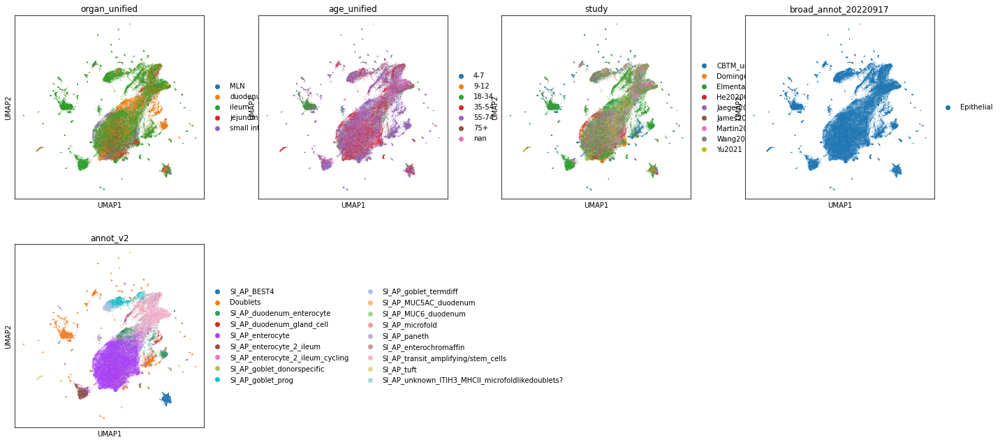

In [8]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata, color=['organ_unified', 'age_unified','study','broad_annot_20220917','annot_v2'])

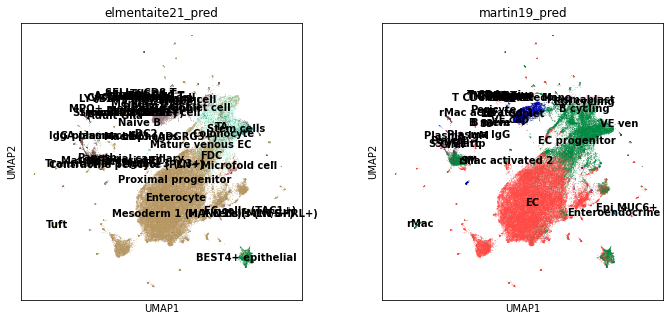

In [9]:
sc.pl.umap(adata, color=['elmentaite21_pred','martin19_pred'],legend_loc='on data')

In [39]:
adata.obs.elmentaite21_pred.value_counts()

Enterocyte                      56942
TA                              11852
Goblet cell                      4896
Paneth                           4329
BEST4+ epithelial                1737
Stem cells                       1230
IgA plasma cell                   681
Tuft                              583
Mesoderm 1 (HAND1+)               341
Microfold cell                    240
Activated CD8 T                   190
Colonocyte                        184
EC cells (TAC1+)                  170
Proximal progenitor               129
Activated CD4 T                    91
SELL+ CD4 T                        57
Naive B                            38
cDC2                               30
CD8 Tmem                           27
Memory B                           26
N cells (NTS+)                     23
Treg                               19
gdT                                17
SELL+ CD8 T                        17
LYVE1+ Macrophage                  17
Cycling B cell                     14
Contractile 

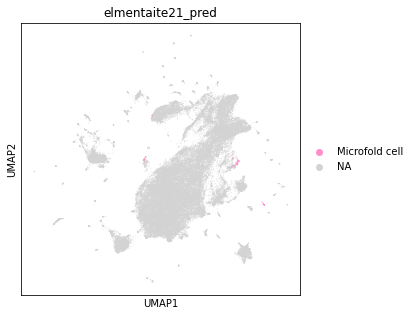

In [40]:
sc.pl.umap(adata,color='elmentaite21_pred',groups='Microfold cell')

In [10]:
adata.X.max()

40699.0

In [11]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

In [12]:
adata.X.max()

9.062463

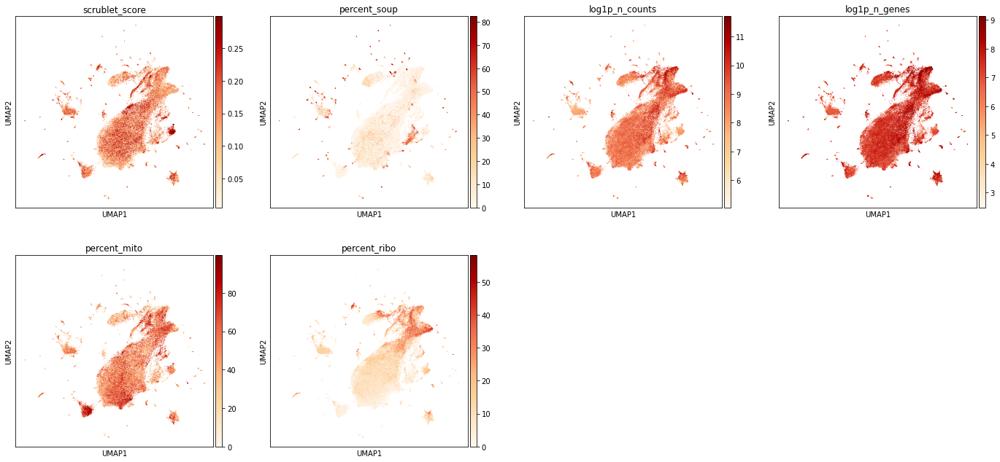

In [13]:
#plot some basic QC
sc.pl.umap(adata, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

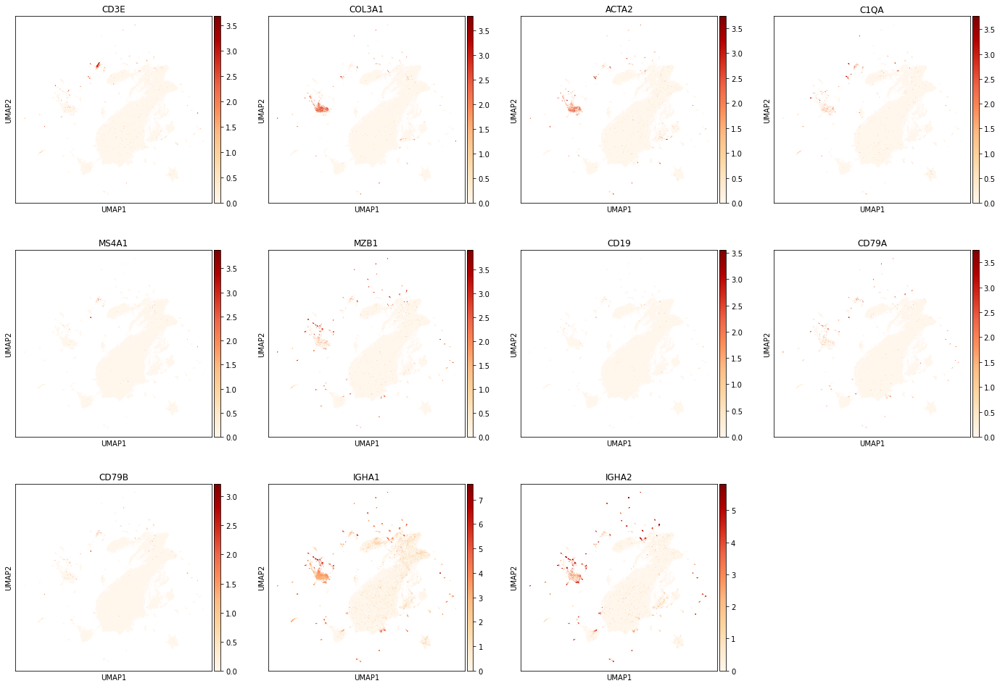

In [14]:
#plot doublet genes
sc.pl.umap(adata, color = ['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','CD19','CD79A','CD79B','IGHA1','IGHA2'],cmap='OrRd')

In [15]:
#score cell cycle genes
cell_cycle_genes = ['MCM5',
'PCNA',
 'TYMS',
 'FEN1',
 'MCM2',
 'MCM4',
 'RRM1',
 'UNG',
 'GINS2',
 'MCM6',
 'CDCA7',
 'DTL',
 'PRIM1',
 'UHRF1',
 'MLF1IP',
 'HELLS',
 'RFC2',
 'RPA2',
 'NASP',
 'RAD51AP1',
 'GMNN',
 'WDR76',
 'SLBP',
 'CCNE2',
 'UBR7',
 'POLD3',
 'MSH2',
 'ATAD2',
 'RAD51',
 'RRM2',
 'CDC45',
 'CDC6',
 'EXO1',
 'TIPIN',
 'DSCC1',
 'BLM',
 'CASP8AP2',
 'USP1',
 'CLSPN',
 'POLA1',
 'CHAF1B',
 'BRIP1',
 'E2F8',
 'HMGB2',
 'CDK1',
 'NUSAP1',
 'UBE2C',
 'BIRC5',
 'TPX2',
 'TOP2A',
 'NDC80',
 'CKS2',
 'NUF2',
 'CKS1B',
 'MKI67',
 'TMPO',
 'CENPF',
 'TACC3',
 'FAM64A',
 'SMC4',
 'CCNB2',
 'CKAP2L',
 'CKAP2',
 'AURKB',
 'BUB1',
 'KIF11',
 'ANP32E',
 'TUBB4B',
 'GTSE1',
 'KIF20B',
 'HJURP',
 'CDCA3',
 'HN1',
 'CDC20',
 'TTK',
 'CDC25C',
 'KIF2C',
 'RANGAP1',
 'NCAPD2',
 'DLGAP5',
 'CDCA2',
 'CDCA8',
 'ECT2',
 'KIF23',
 'HMMR',
 'AURKA',
 'PSRC1',
 'ANLN',
 'LBR',
 'CKAP5',
 'CENPE',
 'CTCF',
 'NEK2',
 'G2E3',
 'GAS2L3',
 'CBX5',
 'CENPA']

In [16]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)
adata = adata[adata.obs.G2M_score.sort_values(ascending=True).index].copy()

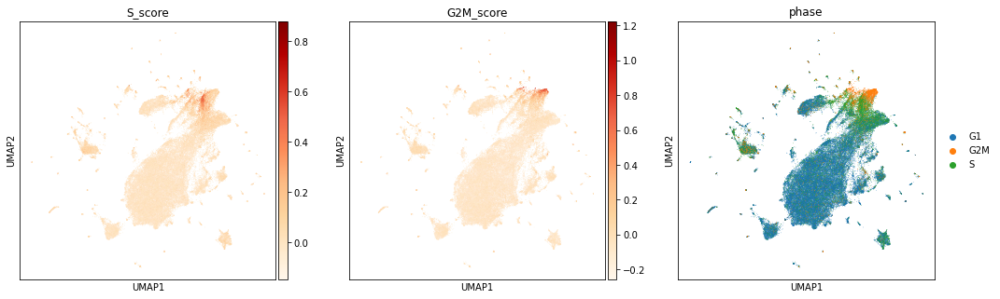

In [17]:
sc.pl.umap(adata,color=['S_score', 'G2M_score', 'phase'],cmap='OrRd')

In [26]:
sc.tl.leiden(adata, resolution = 0.4, neighbors_key="neighbors_scvi")

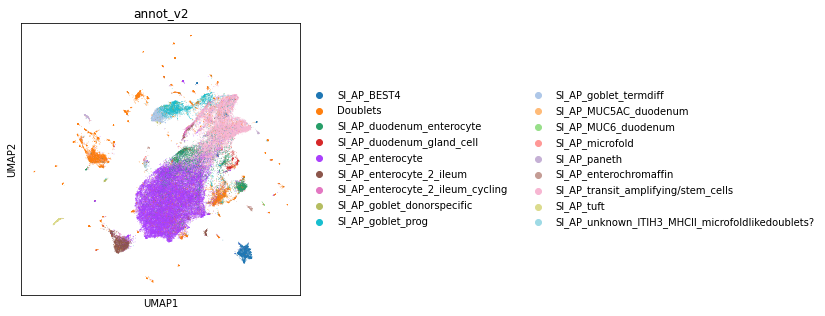

In [32]:
sc.pl.umap(adata,color=['annot_v2'])

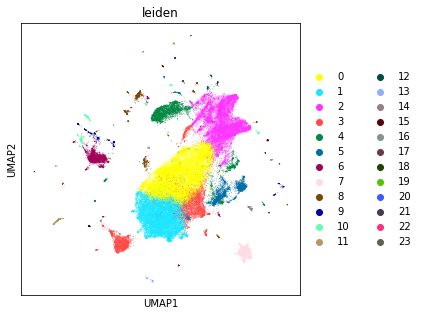

In [35]:
sc.pl.umap(adata,color=['leiden'])

In [20]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import * 

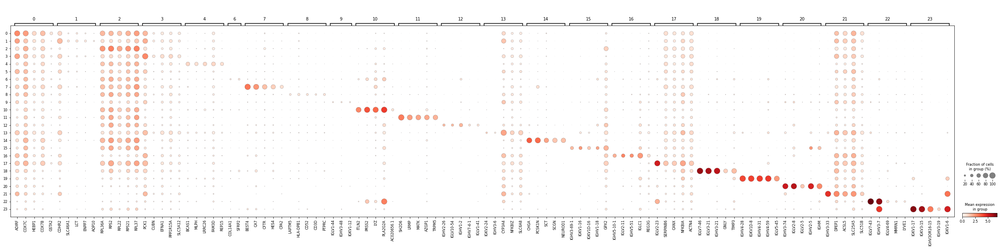

In [28]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden', mks=mks)

In [31]:
pd.set_option('display.max_columns', 100)
pd.crosstab(adata.obs.annot_v2,adata.obs.leiden)

leiden,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
annot_v2,,,,,,,,,,,,,,,,,,,,,,,,
SI_AP_BEST4,86,9,271,16,2,22,14,1944,93,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
Doublets,459,910,704,405,328,1870,3487,15,1424,945,400,4,314,337,1,219,189,5,108,102,82,66,58,40
SI_AP_duodenum_enterocyte,2686,273,569,103,39,1398,134,0,31,15,0,0,2,1,0,0,0,0,0,0,0,0,0,0
SI_AP_duodenum_gland_cell,73,16,80,0,417,24,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
SI_AP_enterocyte,15484,15874,323,4203,39,495,74,11,62,34,0,0,1,3,0,0,8,116,0,0,2,3,0,0
SI_AP_enterocyte_2_ileum,77,42,36,2666,6,39,11,0,1,3,0,0,0,0,0,0,4,0,0,0,0,2,0,0
SI_AP_enterocyte_2_ileum_cycling,9,0,183,295,0,0,7,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
SI_AP_goblet_donorspecific,9,24,31,0,434,17,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
SI_AP_goblet_prog,122,5,770,12,2170,77,17,3,0,0,6,1,3,0,0,13,0,0,0,0,2,0,0,0


In [36]:
adata.obs.annot_v2.value_counts()

SI_AP_enterocyte                                    36732
SI_AP_transit_amplifying/stem_cells                 15646
Doublets                                            12472
SI_AP_duodenum_enterocyte                            5251
SI_AP_goblet_prog                                    3201
SI_AP_enterocyte_2_ileum                             2887
SI_AP_BEST4                                          2457
SI_AP_goblet_termdiff                                1743
SI_AP_tuft                                            641
SI_AP_duodenum_gland_cell                             610
SI_AP_goblet_donorspecific                            516
SI_AP_enterocyte_2_ileum_cycling                      496
SI_AP_paneth                                          404
SI_AP_enterochromaffin                                339
SI_AP_unknown_ITIH3_MHCII_microfoldlikedoublets?      232
SI_AP_MUC5AC_duodenum                                 194
SI_AP_microfold                                       115
SI_AP_MUC6_duo

In [168]:
new_cluster_names = [
    'SI_AP_enterocyte','SI_AP_enterocyte', #0,1
    'SI_AP_stem/TA','SI_AP_enterocyte', #2,3
    'SI_AP_goblet','Doublets', #4,5 - goblet also includes glands
    'Doublets','SI_AP_BEST4', #6,7 
    'Doublets','Doublets', #8,9
    'SI_AP_Paneth','SI_AP_tuft', #10,11 - paneth also contains doublets
    'Doublets','Doublets', #12,13
    'SI_AP_enteroendocrine','Doublets', #14,15
    'Doublets','Doublets', #16,17
    'Doublets','Doublets', #18,19
    'Doublets','Doublets', #20,21
    'Doublets','Doublets', #22,23

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

adata.obs['annot_v3'] = [conv[x] for x in adata.obs['leiden']]

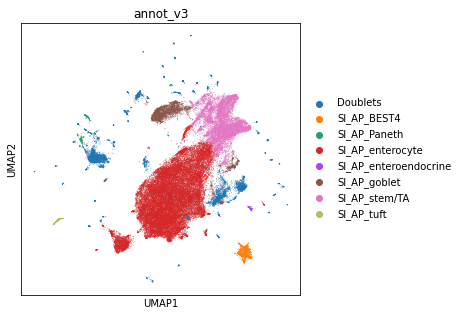

In [169]:
sc.pl.umap(adata,color='annot_v3')

In [41]:
doublets = adata[adata.obs.annot_v3.isin(['Doublets'])].copy()

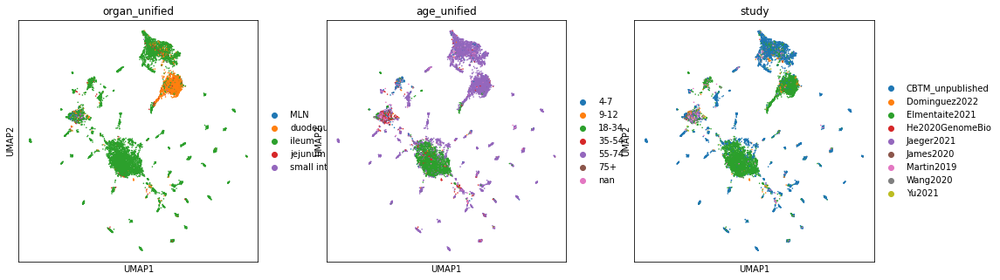

In [42]:
sc.pp.neighbors(
            doublets,
            use_rep="X_scvi",
            n_pcs=doublets.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(doublets, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(doublets, color=['organ_unified', 'age_unified','study'])

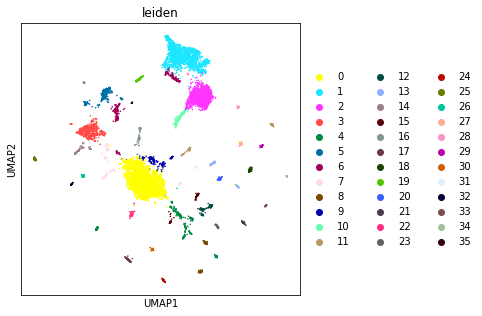

In [55]:
sc.tl.leiden(doublets, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(doublets, color=['leiden'])

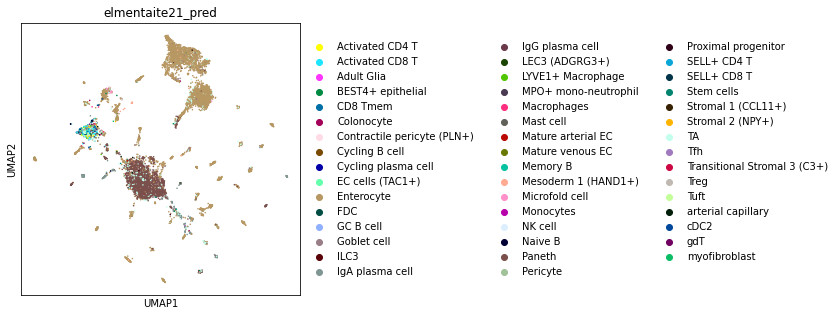

In [46]:
sc.pl.umap(doublets,color='elmentaite21_pred')

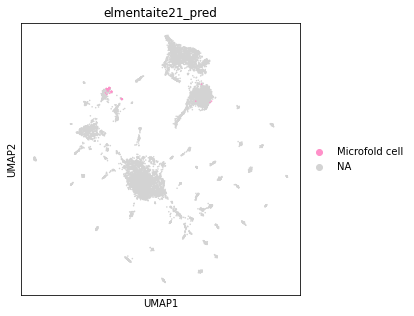

In [47]:
sc.pl.umap(doublets,color='elmentaite21_pred',groups='Microfold cell')

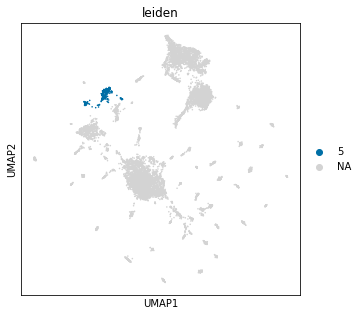

In [56]:
sc.pl.umap(doublets, color=['leiden'],groups='5')

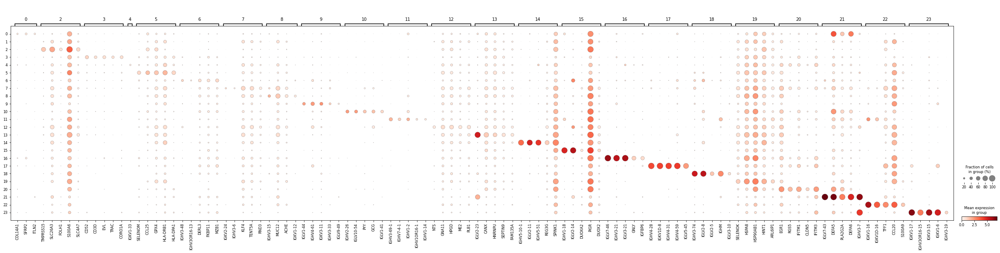

In [51]:
doublets.raw = doublets.copy()
mkst = calc_marker_stats(doublets, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(doublets, groupby='leiden', mks=mks)

In [170]:
new_cluster_names = [
    'Doublets','SI_AP_enterocyte', #0,1
    'SI_AP_enterocyte','Doublets', #2,3
    'Doublets','SI_AP_Microfold', #4,5 
    'Doublets','Doublets', #6,7 
    'Doublets','Doublets', #8,9
    'Doublets','Doublets', #10,11 
    'Doublets','Doublets', #12,13
    'Doublets','Doublets', #14,15
    'Doublets','Doublets', #16,17
    'Doublets','Doublets', #18,19
    'Doublets','Doublets', #20,21
    'Doublets','Doublets', #22,23
    'Doublets','Doublets',
    'Doublets','Doublets',
    'Doublets','Doublets',
    'Doublets','Doublets',
    'Doublets','Doublets',
    'Doublets','Doublets',

]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

doublets.obs['annot_v3'] = [conv[x] for x in doublets.obs['leiden']]

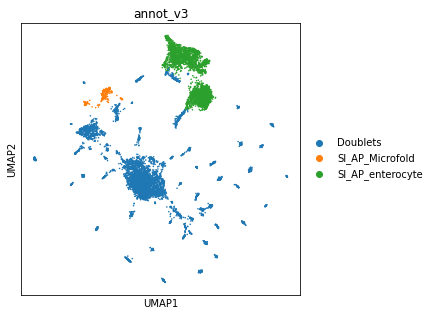

In [171]:
sc.pl.umap(doublets, color=['annot_v3'])

In [172]:
ON = {O:N for O,N in zip(doublets.obs_names,doublets.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

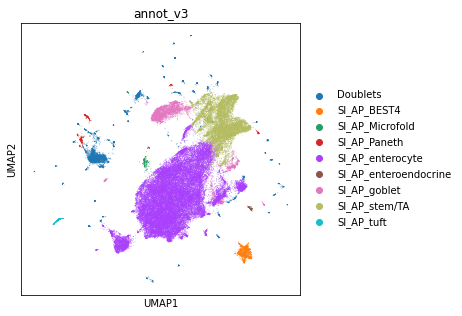

In [173]:
sc.pl.umap(adata,color='annot_v3')

In [ ]:
entero = adata[adata.obs.annot_v3.isin(['SI_AP_enterocyte'])].copy()

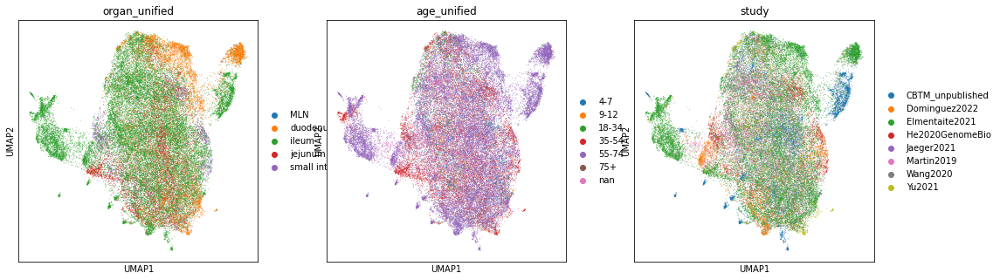

In [72]:
sc.pp.neighbors(
            entero,
            use_rep="X_scvi",
            n_pcs=entero.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(entero, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(entero, color=['organ_unified', 'age_unified','study'])

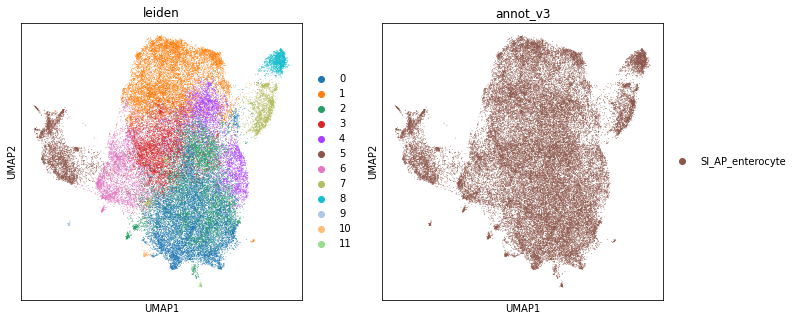

In [80]:
sc.tl.leiden(entero, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(entero, color=['leiden','annot_v3'])

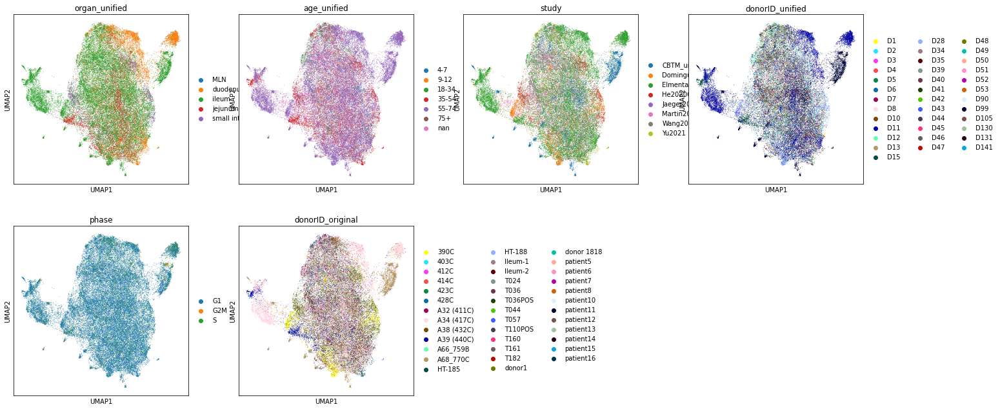

In [84]:
sc.pl.umap(entero, color=['organ_unified', 'age_unified','study','donorID_unified','phase','donorID_original'])

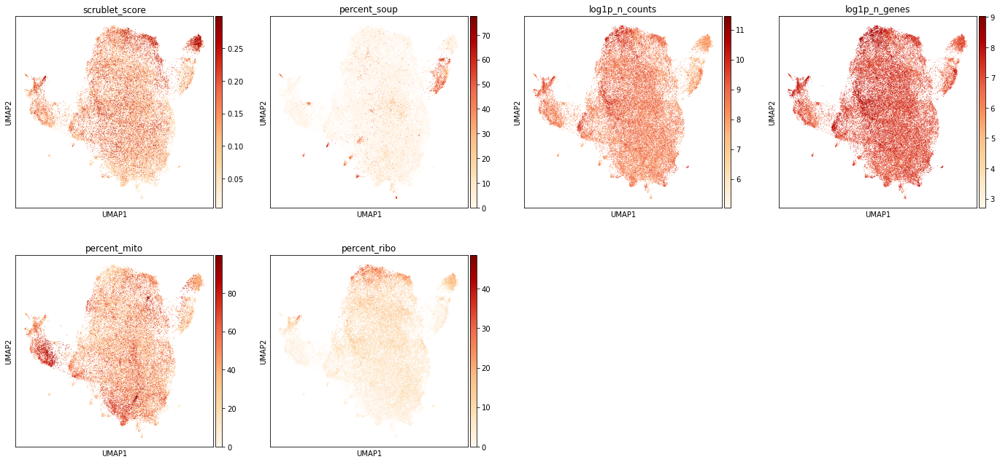

In [75]:
#plot some basic QC
sc.pl.umap(entero, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

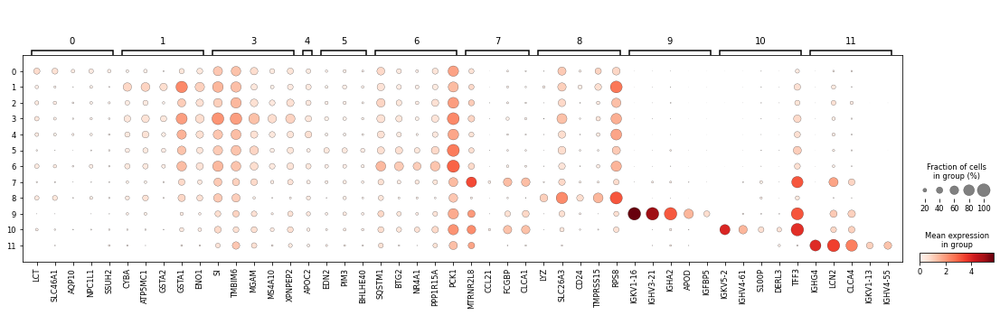

In [77]:
entero.raw = entero.copy()
mkst = calc_marker_stats(entero, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(entero, groupby='leiden', mks=mks)

         Falling back to preprocessing with `sc.pp.pca` and default params.


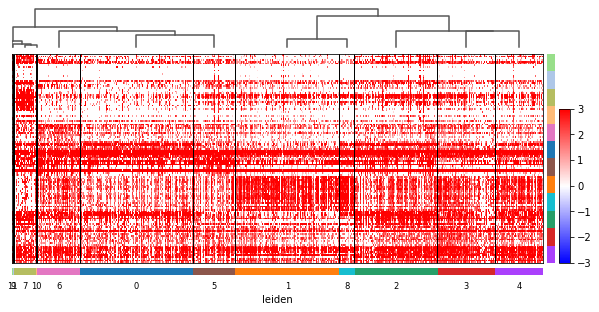

In [82]:
sc.tl.rank_genes_groups(entero,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(entero, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(entero,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

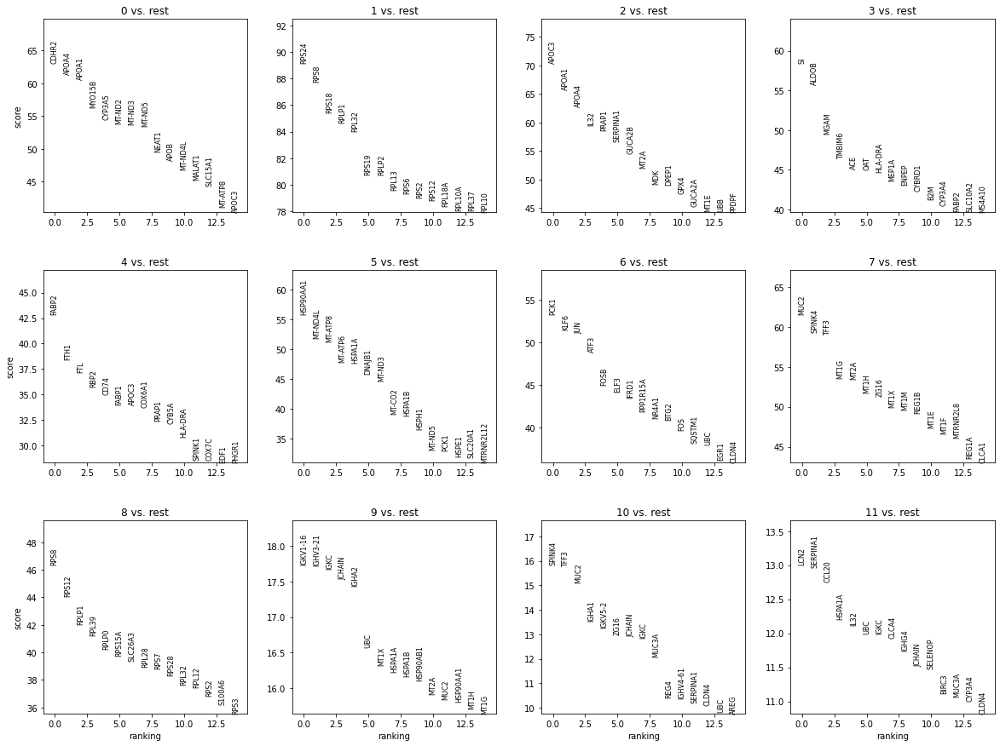

In [83]:
sc.tl.rank_genes_groups(entero, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(entero, n_genes=15, sharey=False)

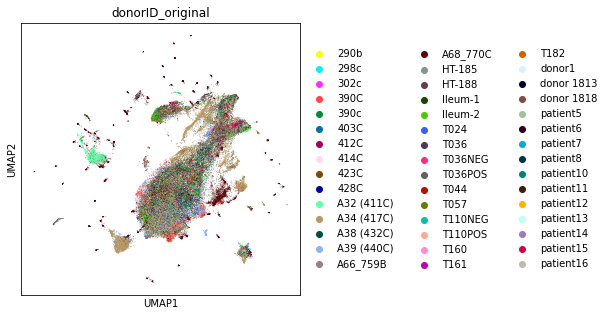

In [85]:
sc.pl.umap(adata,color='donorID_original')

In [174]:
new_cluster_names = [
    'SI_AP_enterocyte','SI_AP_enterocyte', #0,1
    'SI_AP_enterocyte','SI_AP_enterocyte',#2,3
    'SI_AP_enterocyte','Doublets',#4,5 - 5 probably isn't doublets but mainly from one donor - exclude
    'SI_AP_enterocyte','Doublets', #6,7
    'Doublets','Doublets', #8,9
    'Doublets','Doublets' #10,11
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

entero.obs['annot_v3'] = [conv[x] for x in entero.obs['leiden']]

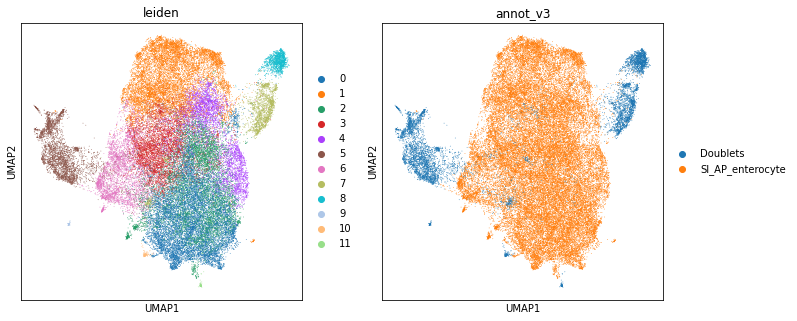

In [175]:
sc.pl.umap(entero, color=['leiden','annot_v3'])

In [176]:
ON = {O:N for O,N in zip(entero.obs_names,entero.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]

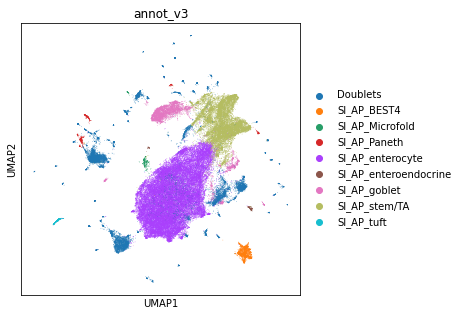

In [177]:
sc.pl.umap(adata,color='annot_v3')

In [93]:
goblet = adata[adata.obs.annot_v3.isin(['SI_AP_goblet'])].copy()

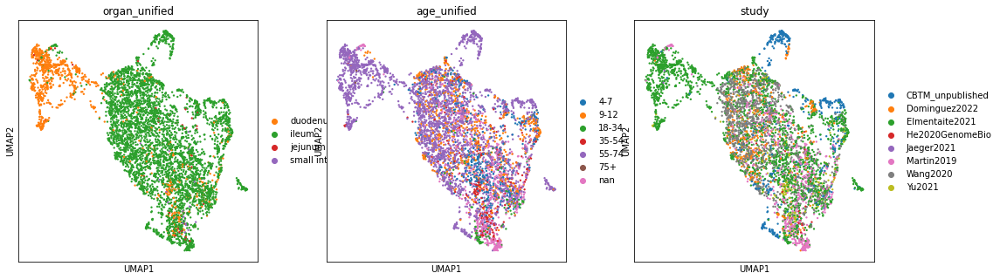

In [95]:
sc.pp.neighbors(
            goblet,
            use_rep="X_scvi",
            n_pcs=goblet.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(goblet, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(goblet, color=['organ_unified', 'age_unified','study'])

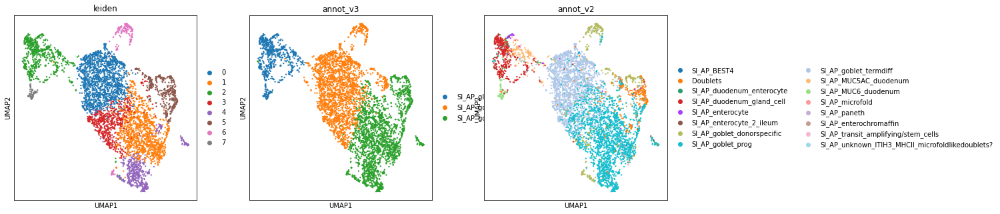

In [126]:
sc.tl.leiden(goblet, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(goblet, color=['leiden','annot_v3','annot_v2'])

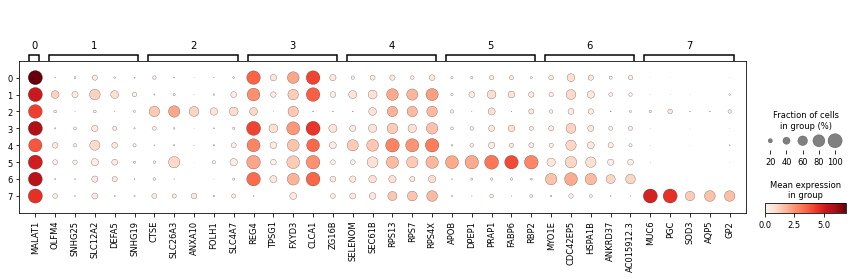

In [97]:
goblet.raw = goblet.copy()
mkst = calc_marker_stats(goblet, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(goblet, groupby='leiden', mks=mks)

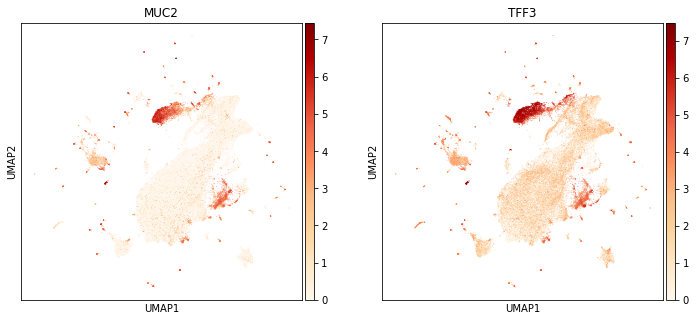

In [99]:
sc.pl.umap(adata,color=['MUC2','TFF3'],cmap='OrRd')

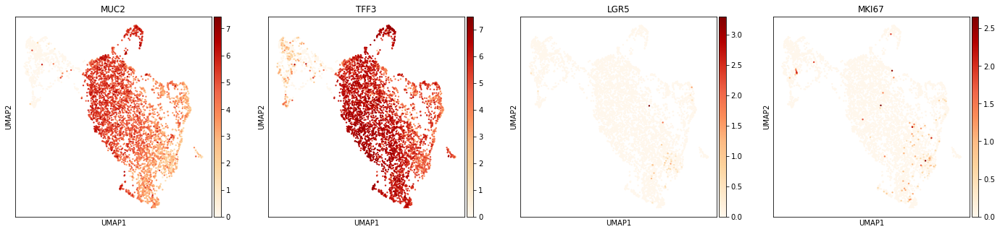

In [102]:
sc.pl.umap(goblet,color=['MUC2','TFF3','LGR5','MKI67'],cmap='OrRd')

         Falling back to preprocessing with `sc.pp.pca` and default params.


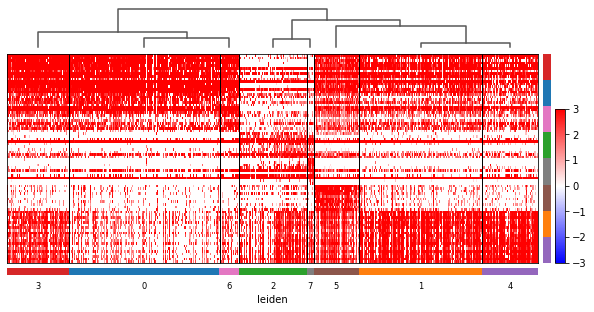

In [103]:
sc.tl.rank_genes_groups(goblet,groupby='leiden',method='wilcoxon')
sc.tl.dendrogram(goblet, groupby='leiden')
sc.pl.rank_genes_groups_heatmap(goblet,groupby='leiden', n_genes=10, use_raw=False, swap_axes=True, show_gene_labels=False,
                                vmin=-3, vmax=3, cmap='bwr')

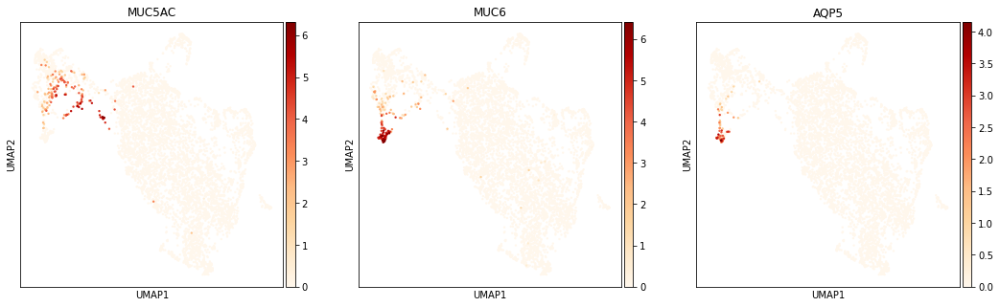

In [105]:
sc.pl.umap(goblet,color=['MUC5AC','MUC6','AQP5'],cmap='OrRd')

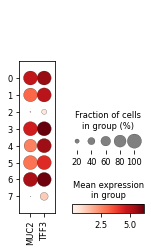

In [107]:
sc.pl.dotplot(goblet,var_names=['MUC2','TFF3'],groupby='leiden')

In [185]:
new_cluster_names = [
    'SI_AP_goblet','SI_AP_goblet_progenitor', #0,1
    'SI_AP_gland','SI_AP_goblet',#2,3
    'SI_AP_goblet_progenitor','Doublets',#4,5 
    'Doublets','SI_AP_MUC6' #6,7 - 6 is donor specific from CBTM unpublished patient
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

goblet.obs['annot_v3'] = [conv[x] for x in goblet.obs['leiden']]

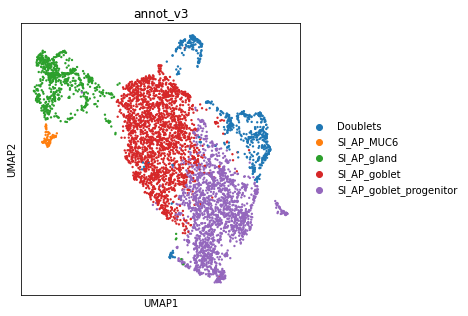

In [186]:
sc.pl.umap(goblet,color='annot_v3')

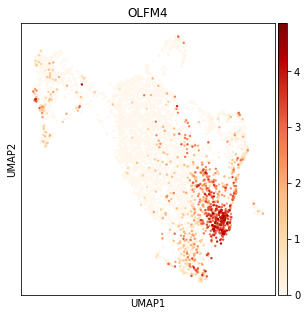

In [180]:
sc.pl.umap(goblet,color=['OLFM4'],cmap='OrRd')

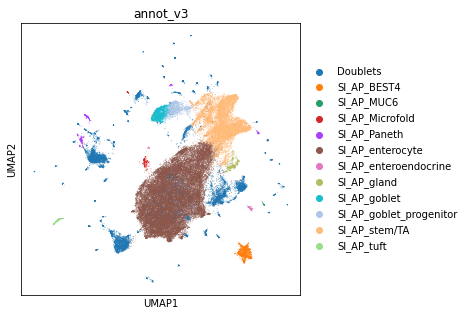

In [187]:
ON = {O:N for O,N in zip(goblet.obs_names,goblet.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

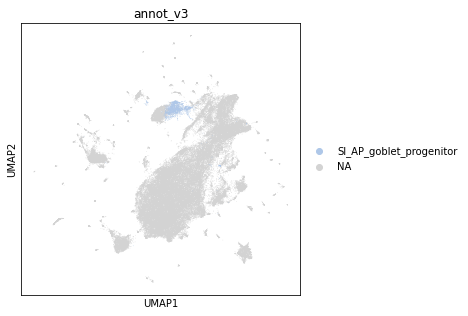

In [150]:
sc.pl.umap(adata,color='annot_v3',groups='SI_AP_goblet_progenitor')

In [151]:
GP = adata[adata.obs.annot_v3.isin(['SI_AP_goblet_progenitor'])].copy()

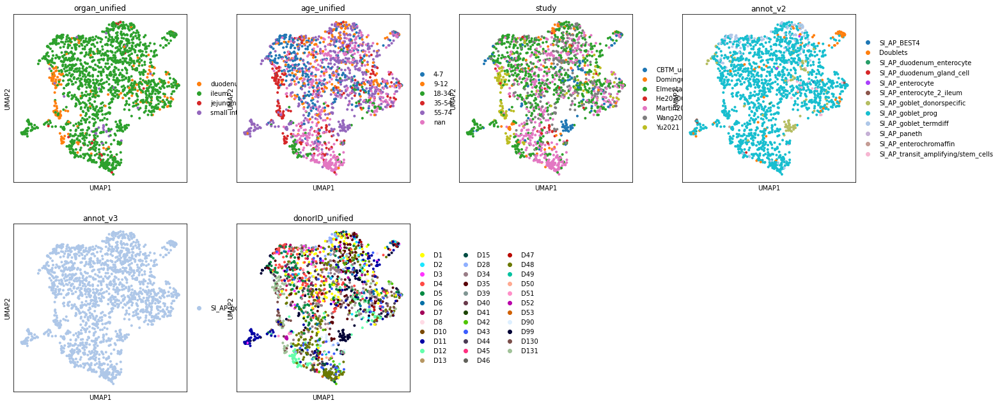

In [153]:
sc.pp.neighbors(
            GP,
            use_rep="X_scvi",
            n_pcs=GP.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(GP, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(GP, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3','donorID_unified'])

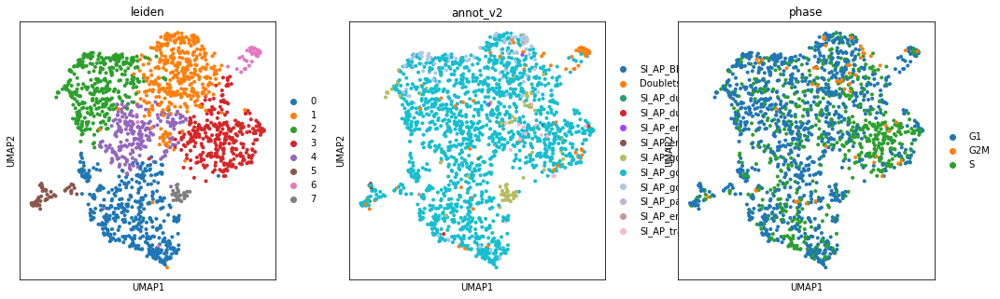

In [284]:
sc.tl.leiden(GP, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(GP, color=['leiden','annot_v2','phase'])

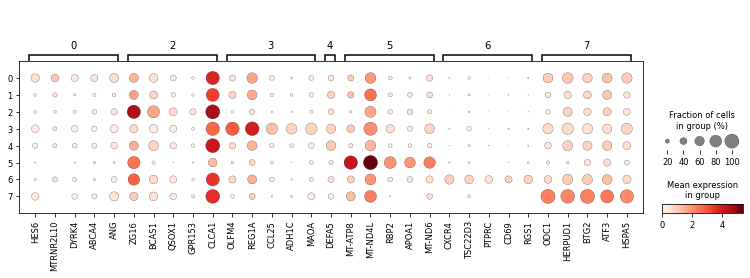

In [156]:
GP.raw = GP.copy()
mkst = calc_marker_stats(GP, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(GP, groupby='leiden', mks=mks)

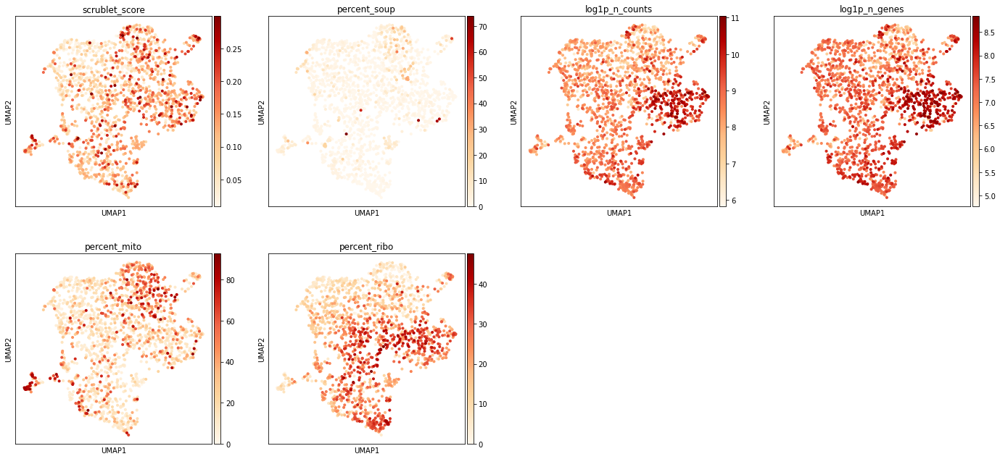

In [158]:
#plot some basic QC
sc.pl.umap(GP, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

In [285]:
new_cluster_names = [
    'SI_AP_goblet_progenitor','SI_AP_goblet_progenitor', #0,1
    'SI_AP_goblet_progenitor','SI_AP_goblet_cycling',#2,3
    'SI_AP_goblet_progenitor','Doublets',#4,5 - 5 is donor specific from CBTM unpublished patient
    'Doublets','SI_AP_goblet_progenitor' #6,7 
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

GP.obs['annot_v3'] = [conv[x] for x in GP.obs['leiden']]

In [ ]:
sc.pl.umap(GP,color='annot_v3')

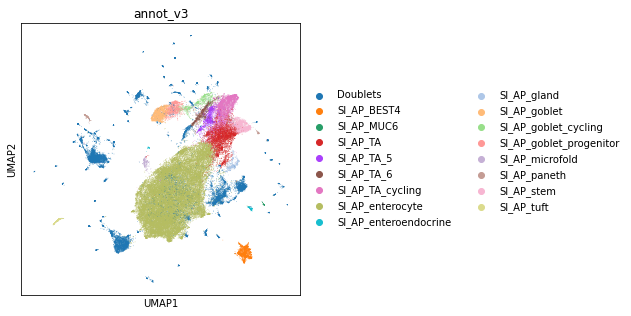

In [286]:
ON = {O:N for O,N in zip(GP.obs_names,GP.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [116]:
gland = adata[adata.obs.annot_v3.isin(['SI_AP_gland','SI_AP_MUC6'])].copy()

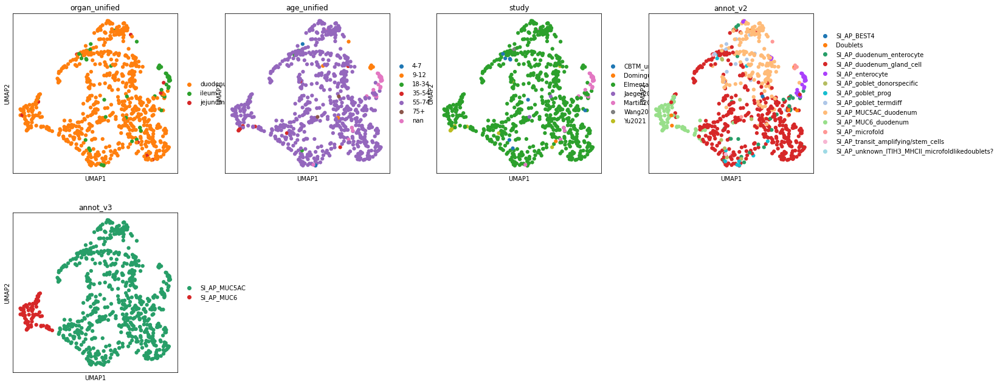

In [118]:
sc.pp.neighbors(
            gland,
            use_rep="X_scvi",
            n_pcs=gland.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(gland, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(gland, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3'])

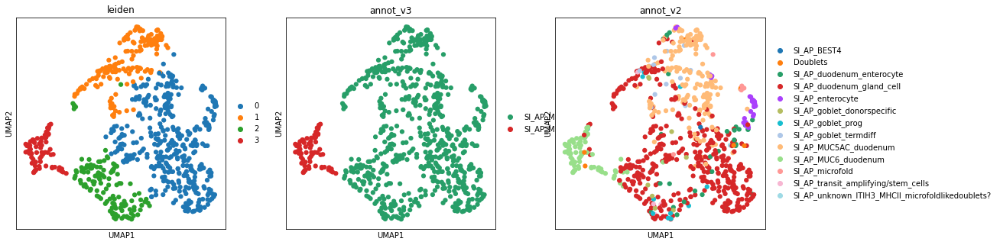

In [120]:
sc.tl.leiden(gland, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(gland, color=['leiden','annot_v3','annot_v2'])

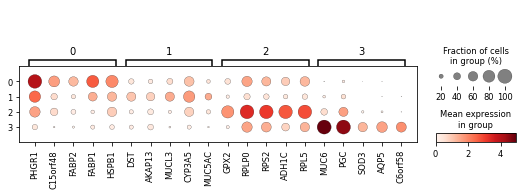

In [121]:
gland.raw = gland.copy()
mkst = calc_marker_stats(gland, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(gland, groupby='leiden', mks=mks)

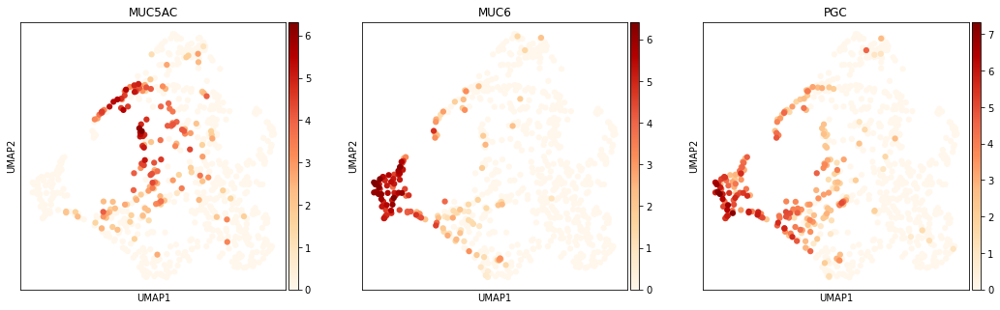

In [123]:
sc.pl.umap(gland,color=['MUC5AC','MUC6','PGC'],cmap='OrRd')

Keep as gland and MUC6 gland cells

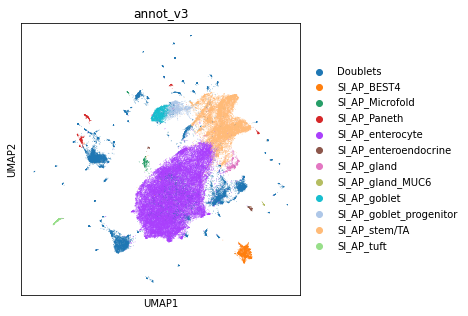

In [184]:
sc.pl.umap(adata,color='annot_v3')

In [188]:
paneth = adata[adata.obs.annot_v3.isin(['SI_AP_Paneth'])].copy()

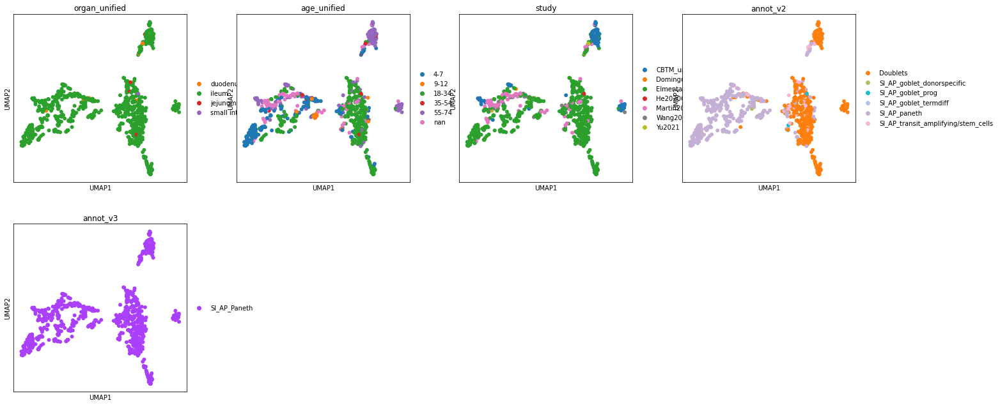

In [189]:
sc.pp.neighbors(
            paneth,
            use_rep="X_scvi",
            n_pcs=paneth.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(paneth, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(paneth, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3'])

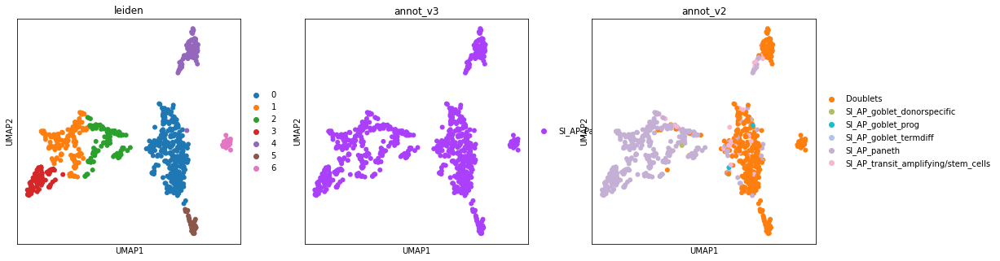

In [195]:
sc.tl.leiden(paneth, resolution = 0.4, neighbors_key="neighbors_scvi")
sc.pl.umap(paneth, color=['leiden','annot_v3','annot_v2'])

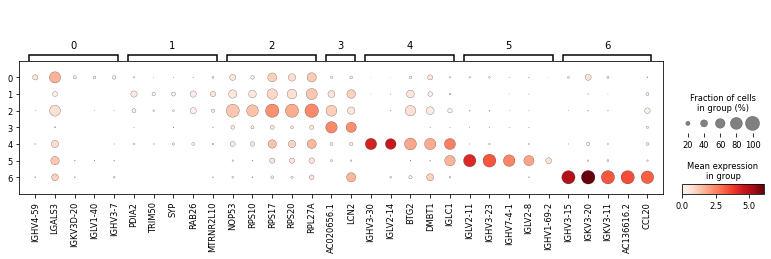

In [196]:
paneth.raw = paneth.copy()
mkst = calc_marker_stats(paneth, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(paneth, groupby='leiden', mks=mks)

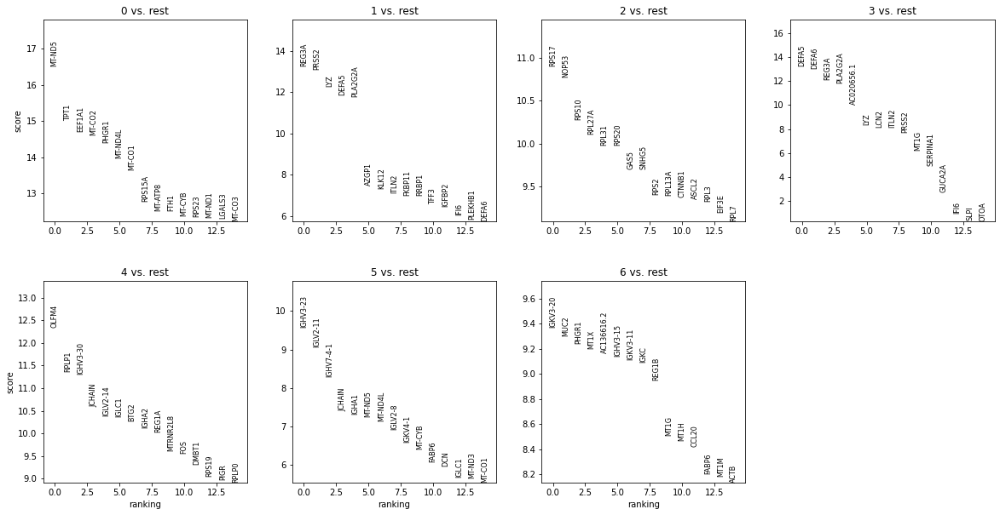

In [197]:
sc.tl.rank_genes_groups(paneth, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(paneth, n_genes=15, sharey=False)

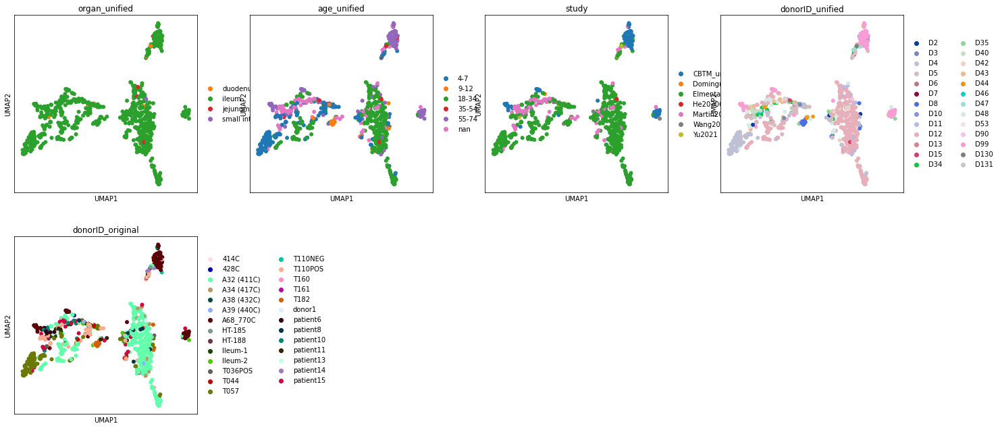

In [199]:
sc.pl.umap(paneth, color=['organ_unified', 'age_unified','study','donorID_unified','donorID_original'])

In [206]:
new_cluster_names = [
    'Doublets','SI_AP_paneth', #0,1
    'SI_AP_paneth','SI_AP_paneth',#2,3
    'Doublets','Doublets',#4,5
    'Doublets'
    
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

paneth.obs['annot_v3'] = [conv[x] for x in paneth.obs['leiden']]

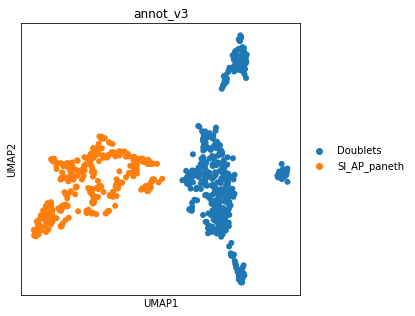

In [207]:
sc.pl.umap(paneth,color='annot_v3')

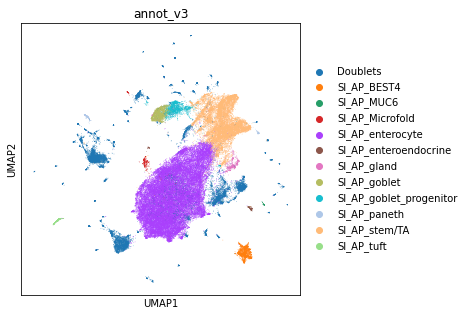

In [208]:
ON = {O:N for O,N in zip(paneth.obs_names,paneth.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [209]:
MF = adata[adata.obs.annot_v3.isin(['SI_AP_Microfold'])].copy()

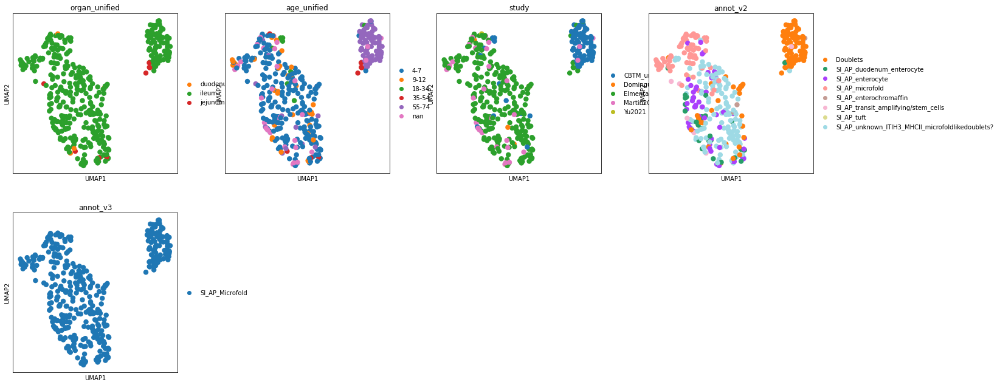

In [210]:
sc.pp.neighbors(
            MF,
            use_rep="X_scvi",
            n_pcs=MF.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(MF, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(MF, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3'])

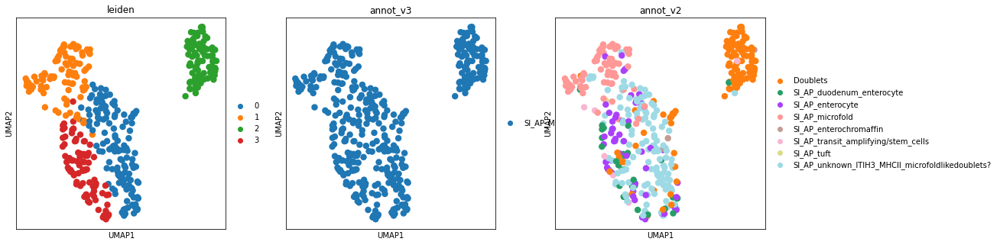

In [230]:
sc.tl.leiden(MF, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(MF, color=['leiden','annot_v3','annot_v2'])

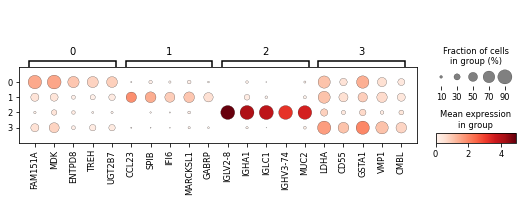

In [231]:
MF.raw = MF.copy()
mkst = calc_marker_stats(MF, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(MF, groupby='leiden', mks=mks)

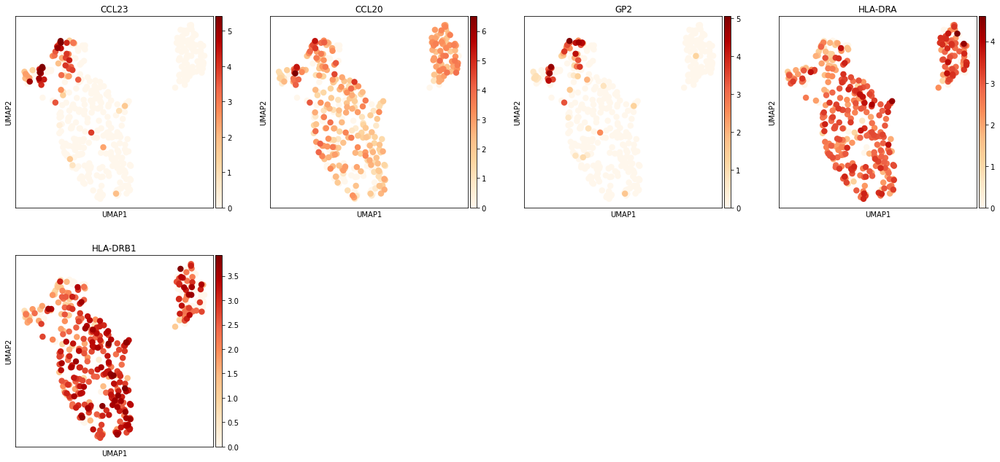

In [242]:
sc.pl.umap(MF,color=['CCL23','CCL20','GP2','HLA-DRA','HLA-DRB1'],cmap='OrRd')

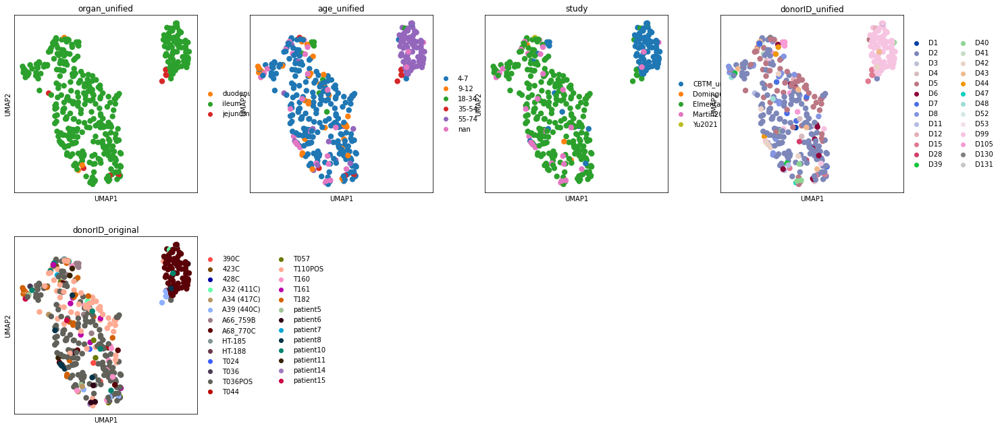

In [234]:
sc.pl.umap(MF, color=['organ_unified', 'age_unified','study','donorID_unified','donorID_original'])

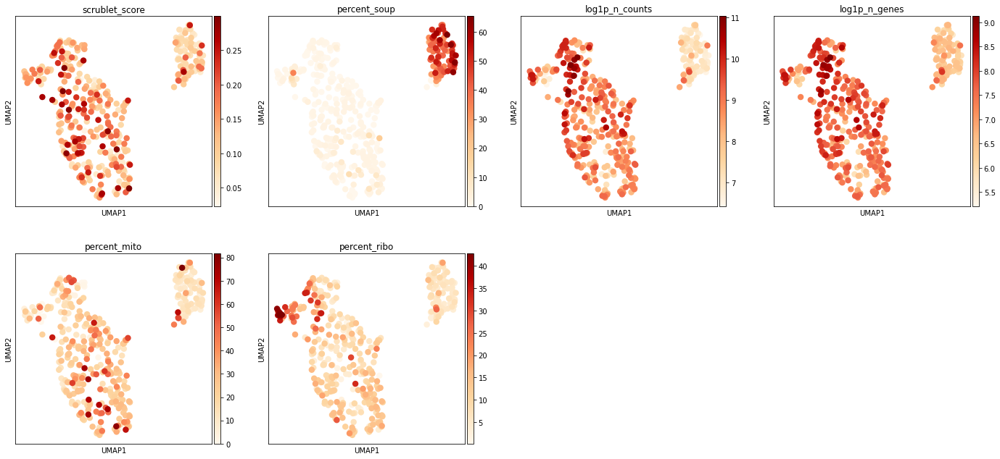

In [235]:
#plot some basic QC
sc.pl.umap(MF, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

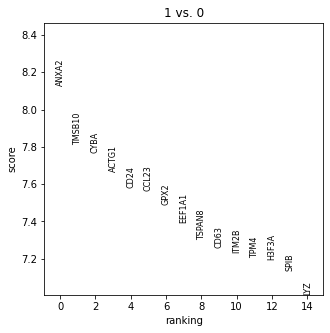

In [236]:
sc.tl.rank_genes_groups(MF, 'leiden', method='wilcoxon',groups=['1'], reference='0')
sc.pl.rank_genes_groups(MF, n_genes=15, sharey=False,groups=['1'])

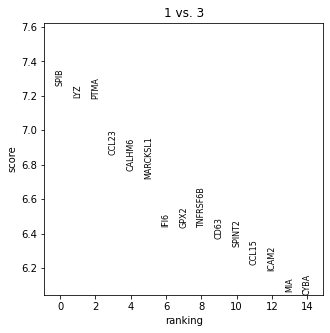

In [238]:
sc.tl.rank_genes_groups(MF, 'leiden', method='wilcoxon',groups=['1'], reference='3')
sc.pl.rank_genes_groups(MF, n_genes=15, sharey=False,groups=['1'])

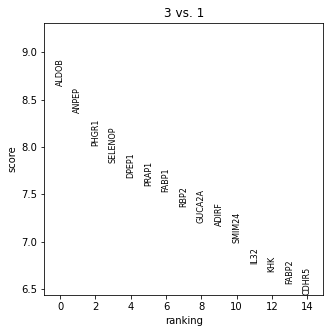

In [239]:
sc.tl.rank_genes_groups(MF, 'leiden', method='wilcoxon',groups=['3'], reference='1')
sc.pl.rank_genes_groups(MF, n_genes=15, sharey=False,groups=['3'])

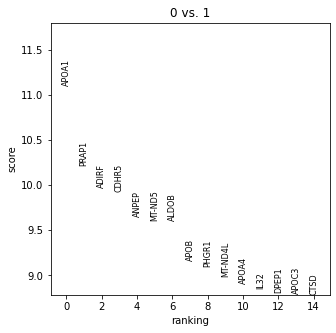

In [240]:
sc.tl.rank_genes_groups(MF, 'leiden', method='wilcoxon',groups=['0'], reference='1')
sc.pl.rank_genes_groups(MF, n_genes=15, sharey=False,groups=['0'])

In [248]:
new_cluster_names = [
    'SI_AP_microfold','SI_AP_microfold', #0,1
    'Doublets','SI_AP_microfold',#2,3
    
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

MF.obs['annot_v3'] = [conv[x] for x in MF.obs['leiden']]

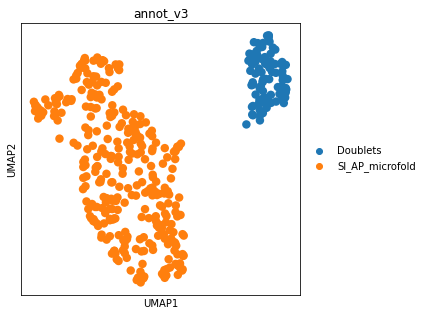

In [249]:
sc.pl.umap(MF,color='annot_v3')

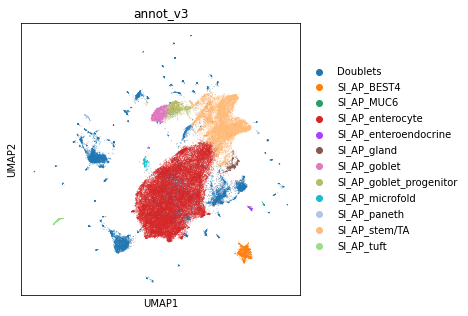

In [250]:
ON = {O:N for O,N in zip(MF.obs_names,MF.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

In [246]:
stem = adata[adata.obs.annot_v3.isin(['SI_AP_stem/TA'])].copy()

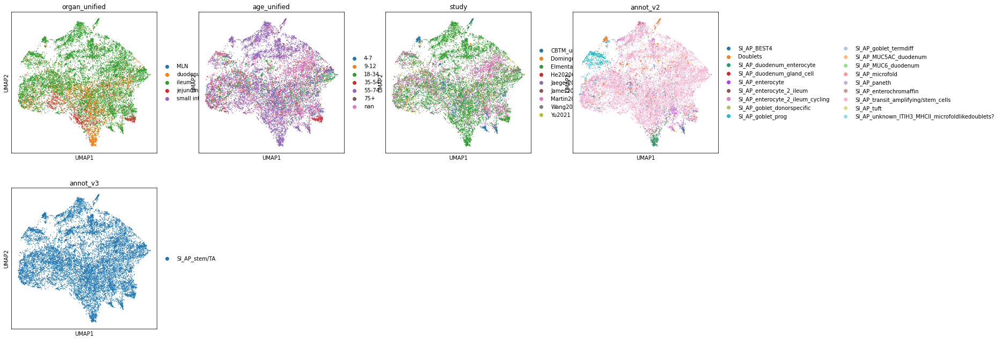

In [247]:
sc.pp.neighbors(
            stem,
            use_rep="X_scvi",
            n_pcs=stem.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(stem, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(stem, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3'])

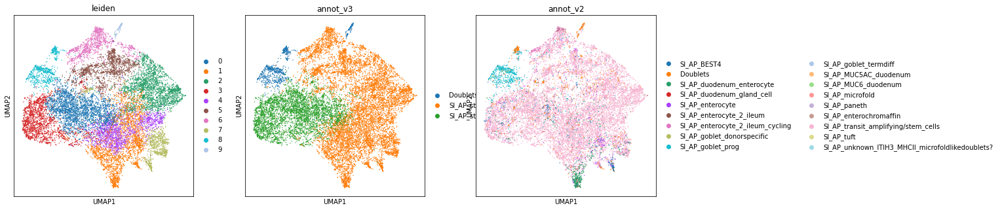

In [279]:
sc.tl.leiden(stem, resolution = 0.5, neighbors_key="neighbors_scvi")
sc.pl.umap(stem, color=['leiden','annot_v3','annot_v2'])

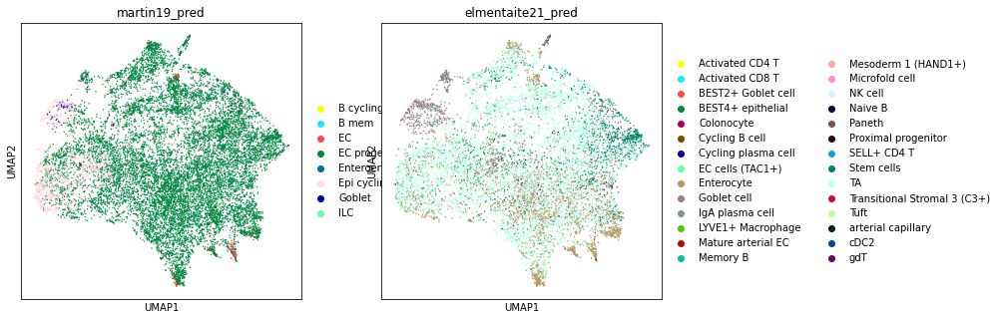

In [276]:
sc.pl.umap(stem,color=['martin19_pred','elmentaite21_pred'])

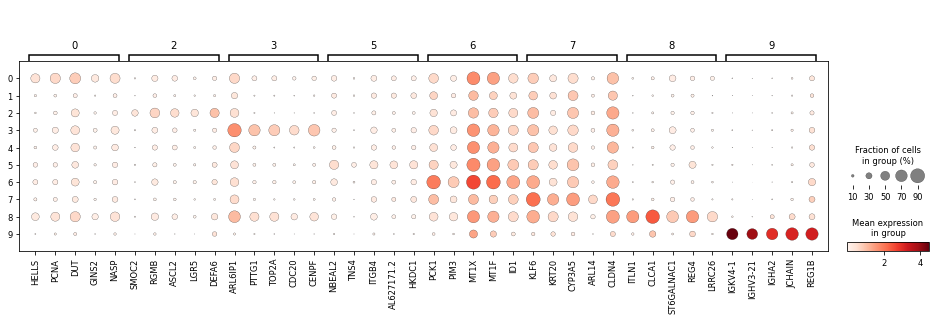

In [260]:
stem.raw = stem.copy()
mkst = calc_marker_stats(stem, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(stem, groupby='leiden', mks=mks)

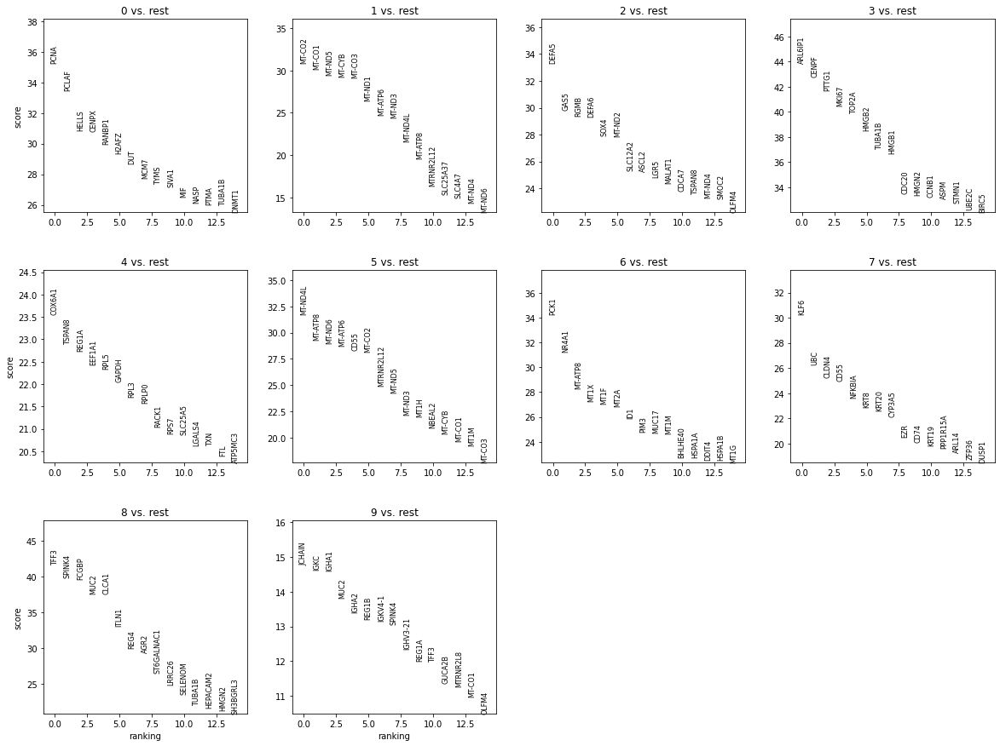

In [287]:
sc.tl.rank_genes_groups(stem, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(stem, n_genes=15, sharey=False)

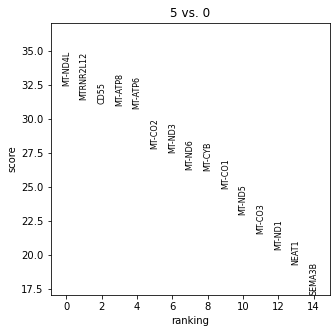

In [289]:
sc.tl.rank_genes_groups(stem, 'leiden', method='wilcoxon',groups=['5'],reference='0')
sc.pl.rank_genes_groups(stem, n_genes=15, sharey=False,groups=['5'])

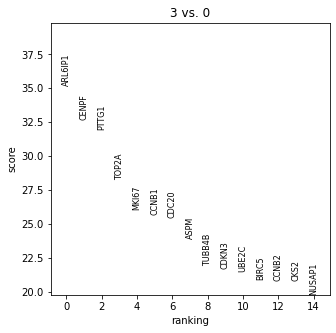

In [290]:
sc.tl.rank_genes_groups(stem, 'leiden', method='wilcoxon',groups=['3'],reference='0')
sc.pl.rank_genes_groups(stem, n_genes=15, sharey=False,groups=['3'])

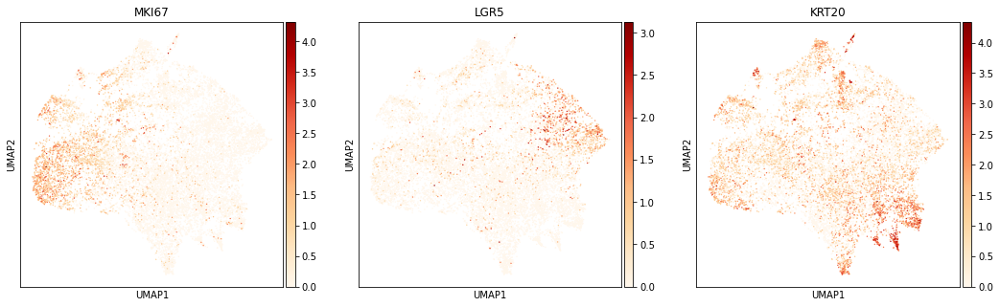

In [261]:
sc.pl.umap(stem,color=['MKI67','LGR5','KRT20'],cmap='OrRd')

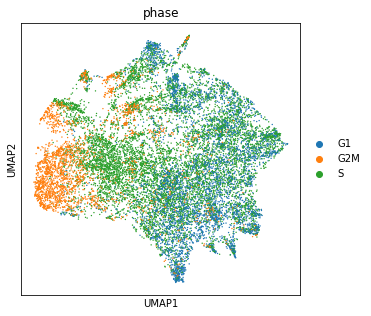

In [271]:
sc.pl.umap(stem,color='phase')

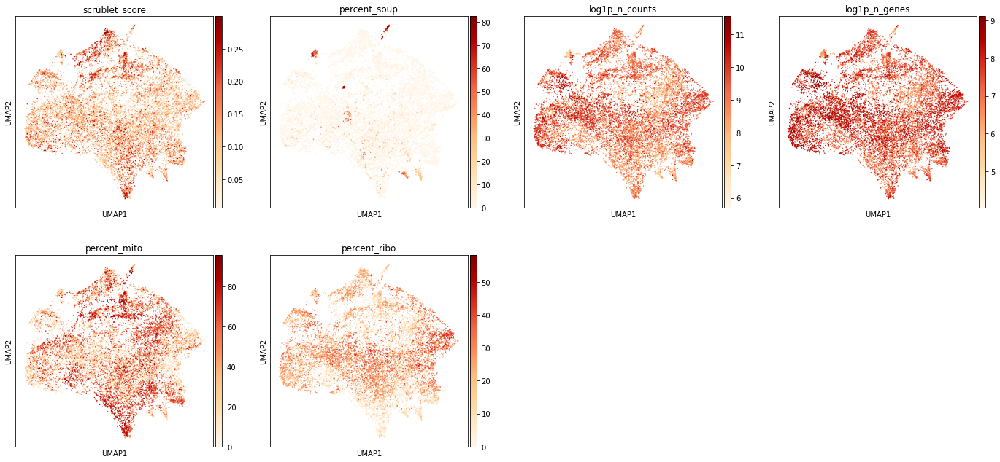

In [264]:
#plot some basic QC
sc.pl.umap(stem, color = ['scrublet_score','percent_soup','log1p_n_counts','log1p_n_genes','percent_mito','percent_ribo'],cmap='OrRd')

In [301]:
new_cluster_names = [
    'SI_AP_TA_cycling','SI_AP_TA', #0,1
    'SI_AP_stem','SI_AP_TA_cycling',#2,3
    'SI_AP_TA','Doublets',#4,5
    'Doublets','SI_AP_TA',#6,7
    'SI_AP_goblet_cycling','Doublets'#8,9
    
    
]

conv = {str(i):name for i,name in enumerate(new_cluster_names)}

stem.obs['annot_v3'] = [conv[x] for x in stem.obs['leiden']]

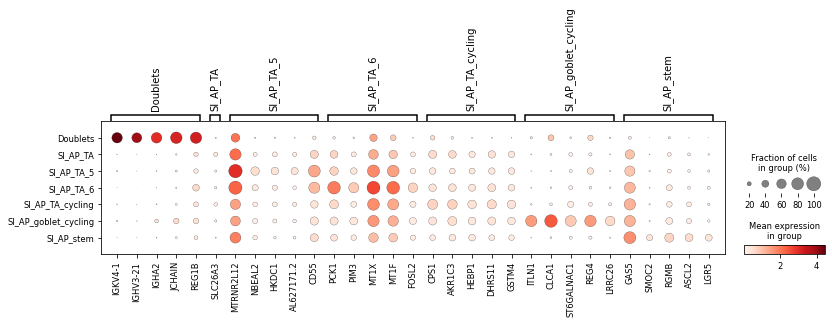

In [293]:
stem.raw = stem.copy()
mkst = calc_marker_stats(stem, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(stem, groupby='annot_v3', mks=mks)

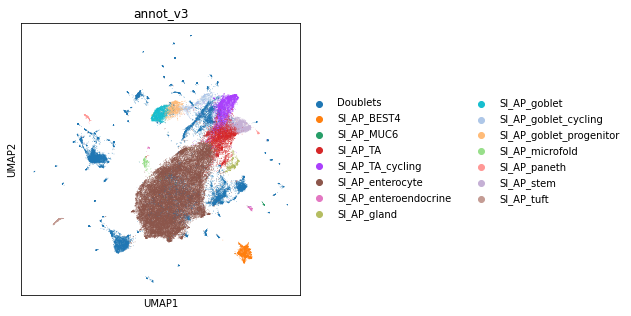

In [302]:
ON = {O:N for O,N in zip(stem.obs_names,stem.obs["annot_v3"])}
adata.obs["annot_v3"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["annot_v3"])]
sc.pl.umap(adata,color='annot_v3')

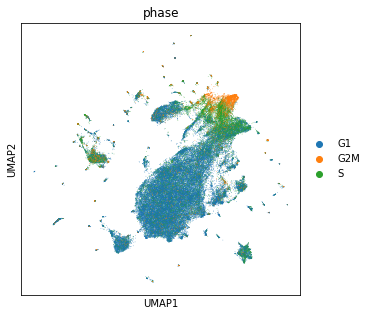

In [272]:
sc.pl.umap(adata,color='phase')

In [268]:
entero = adata[adata.obs.annot_v3.isin(['SI_AP_enteroendocrine'])].copy()

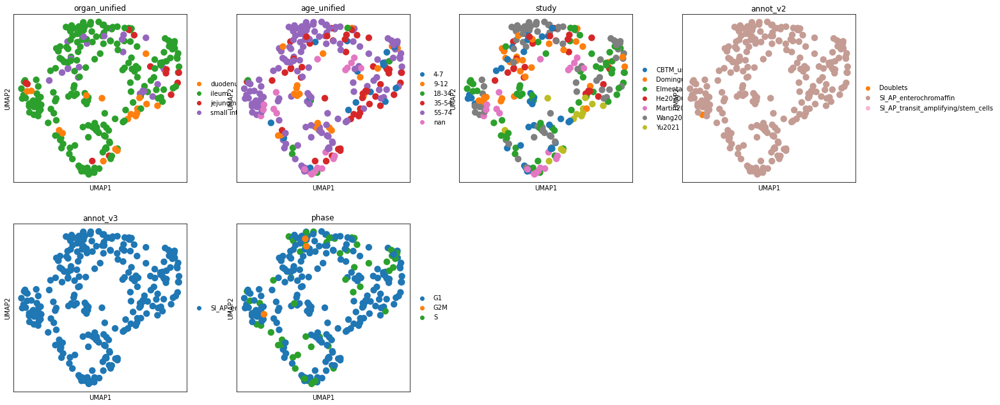

In [270]:
sc.pp.neighbors(
            entero,
            use_rep="X_scvi",
            n_pcs=entero.obsm["X_scvi"].shape[1],
            n_neighbors=15,
            key_added="neighbors_scvi",
        )
sc.tl.umap(entero, neighbors_key="neighbors_scvi", min_dist=0.1)
sc.pl.umap(entero, color=['organ_unified', 'age_unified','study','annot_v2','annot_v3','phase'])

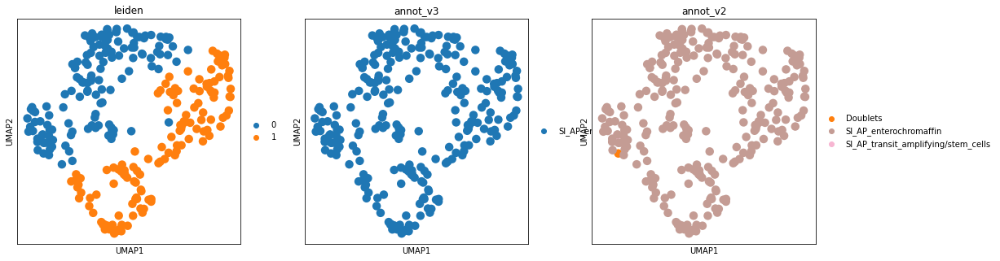

In [297]:
sc.tl.leiden(entero, resolution = 0.2, neighbors_key="neighbors_scvi")
sc.pl.umap(entero, color=['leiden','annot_v3','annot_v2'])

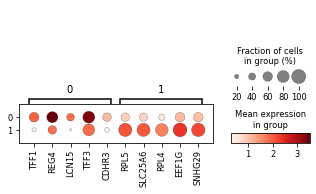

In [298]:
entero.raw = entero.copy()
mkst = calc_marker_stats(entero, groupby="leiden")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(entero, groupby='leiden', mks=mks)

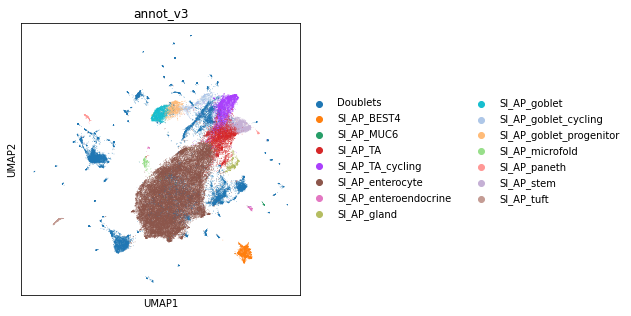

In [309]:
sc.pl.umap(adata,color='annot_v3')

In [ ]:
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="annot_v3")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='annot_v3', mks=mks)

In [306]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.22021128.h5ad')

In [310]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [311]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/SI_AP_epi_annot_v3.csv')

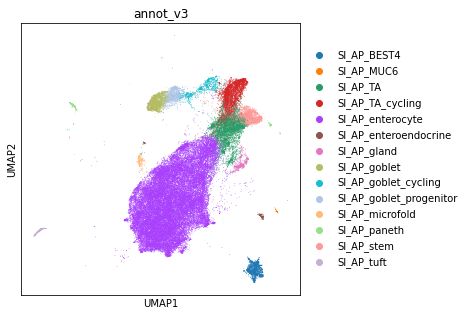

In [303]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [312]:
adata_nodoublets.X.max()

9.062463

In [313]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [14]:
adata_nodoublets.X.max()

40699.0

In [315]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/SI_AP_epi.raw.annotv3.nodoublets.22021128.h5ad')

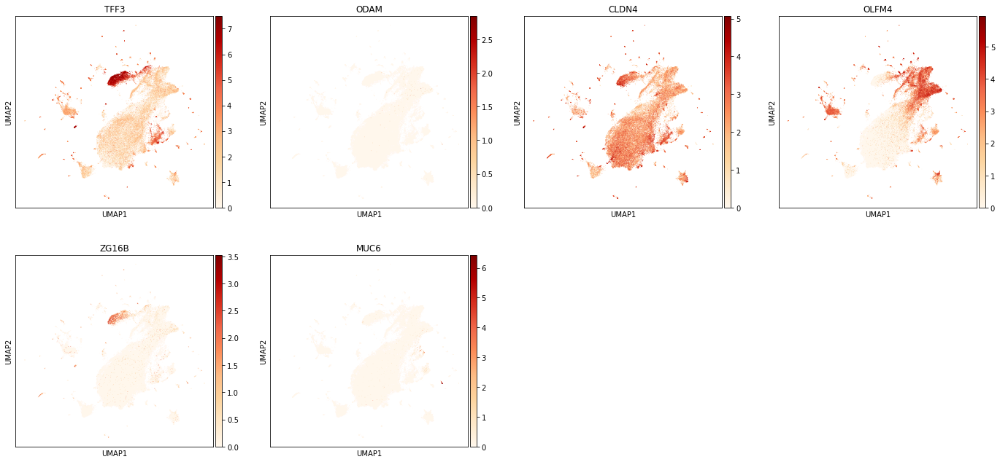

In [318]:
sc.pl.umap(adata,color=['TFF3','ODAM','CLDN4','OLFM4','ZG16B','MUC6'],cmap='OrRd')

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.22021128.h5ad')

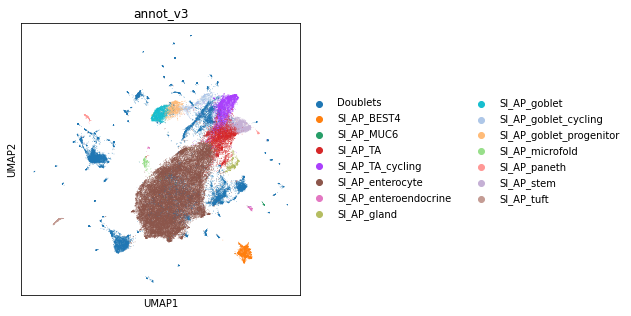

In [4]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='annot_v3')

In [5]:
adata.obs['annot_v3'] = (
    adata.obs["annot_v3"]
    .map(lambda x: {'SI_AP_gland':'SI_AP_MUC5AC'}.get(x, x))
    .astype("category")
)

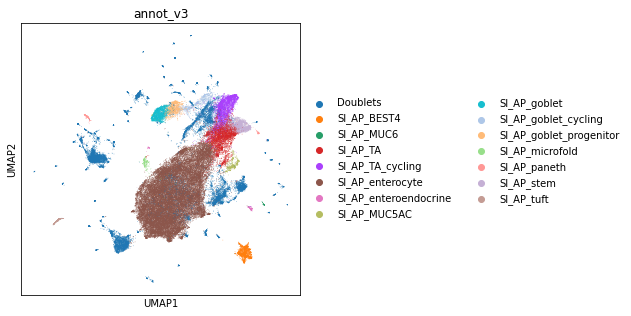

In [6]:
sc.pl.umap(adata,color='annot_v3')

In [16]:
adata.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [8]:
annot = adata.obs.loc[:,['annot_v2','annot_v3']]

In [9]:
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/csv/SI_AP_epi_annot_v3.csv')

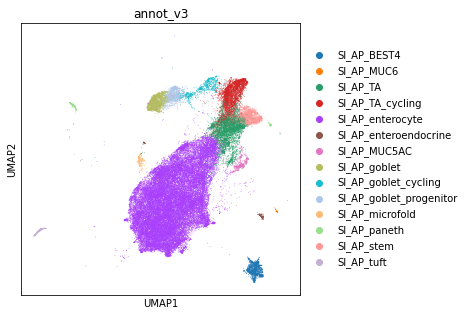

In [10]:
adata_nodoublets = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()
sc.pl.umap(adata_nodoublets,color='annot_v3')

In [11]:
#recover raw
adata_nodoublets.X = adata_nodoublets.layers['counts']

In [12]:
adata_nodoublets.X.max()

40699.0

In [15]:
adata_nodoublets.write_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/pre_scvi20221124/no_doublets/SI_AP_epi.raw.annotv3.nodoublets.22021206.h5ad')

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.22021206.h5ad')

In [3]:
adata = adata[~adata.obs.annot_v3.isin(['Doublets'])].copy()

## Plots for figures

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


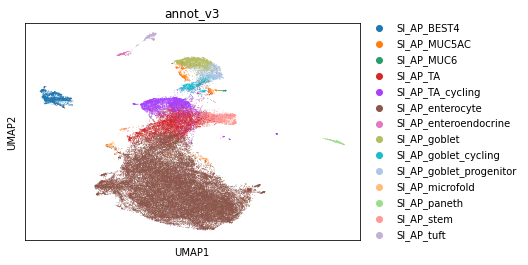

In [3]:
sc.pl.umap(adata,color='annot_v3')

In [4]:
list(adata.obs.annot_v3.unique())

['SI_AP_enterocyte',
 'SI_AP_BEST4',
 'SI_AP_stem',
 'SI_AP_TA',
 'SI_AP_enteroendocrine',
 'SI_AP_microfold',
 'SI_AP_tuft',
 'SI_AP_MUC6',
 'SI_AP_goblet_progenitor',
 'SI_AP_MUC5AC',
 'SI_AP_goblet',
 'SI_AP_goblet_cycling',
 'SI_AP_TA_cycling',
 'SI_AP_paneth']

In [5]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("SI_AP_","")

In [6]:
list(adata.obs.fine_annot.unique())

['enterocyte',
 'BEST4',
 'stem',
 'TA',
 'enteroendocrine',
 'microfold',
 'tuft',
 'MUC6',
 'goblet_progenitor',
 'MUC5AC',
 'goblet',
 'goblet_cycling',
 'TA_cycling',
 'paneth']

In [7]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {
 'enterocyte':'Enterocyte',
        'stem':'Stem',
 'enteroendocrine':'Enteroendocrine',
 'microfold':'Microfold',
 'tuft':'Tuft',
 'goblet_progenitor':'Goblet_progenitor',
 'goblet':'Goblet',
 'goblet_cycling':'Goblet_cycling',
 'paneth':'Paneth'
        
         }.get(x, x))
    .astype("category")
)

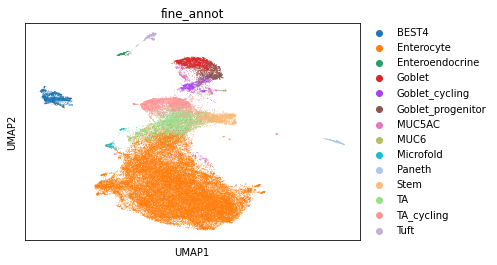

In [8]:
sc.pl.umap(adata,color='fine_annot')

In [9]:
adata.obs.fine_annot.cat.categories

Index(['BEST4', 'Enterocyte', 'Enteroendocrine', 'Goblet', 'Goblet_cycling',
       'Goblet_progenitor', 'MUC5AC', 'MUC6', 'Microfold', 'Paneth', 'Stem',
       'TA', 'TA_cycling', 'Tuft'],
      dtype='object')

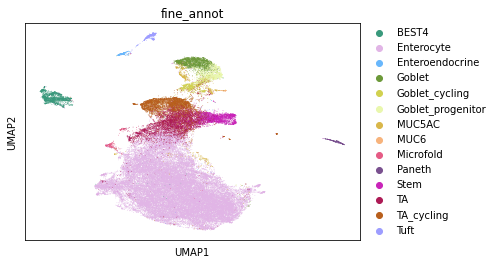

In [10]:
sc.pl.umap(adata,color='fine_annot',palette = ['#39997c',#BEST4
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                               
                                               '#6c9939',#goblet
                                               '#d1d14f',#goblet_cycling
                                               '#e9f7ad',#goblet progenitor
                                               
                                               '#d9b74a',#MUC5AC
                                               '#f7b37c',#MUC6
                                               
                                               '#e55b85',#Microfold
                                               '#79508f',#paneth
                                               '#c924b9',#stem
                                              '#ad1a55',#TA
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                               
                                               
    
    
                                              ])

In [11]:
#save raw counts in layers
adata.layers['counts'] = adata.X
#normalise and transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

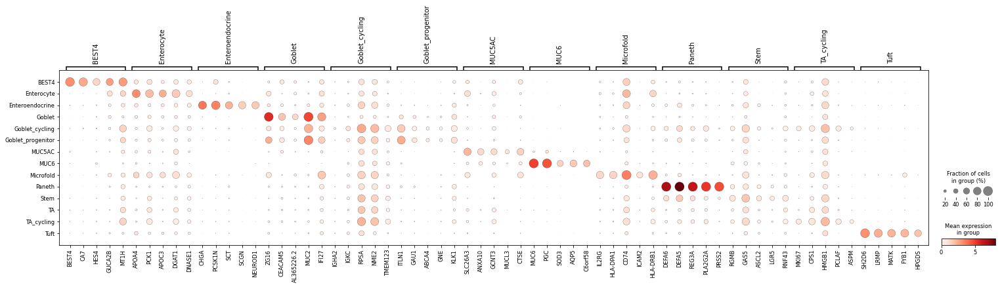

In [12]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="fine_annot")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='fine_annot', mks=mks)

In [13]:
adata.obs.fine_annot.cat.categories

Index(['BEST4', 'Enterocyte', 'Enteroendocrine', 'Goblet', 'Goblet_cycling',
       'Goblet_progenitor', 'MUC5AC', 'MUC6', 'Microfold', 'Paneth', 'Stem',
       'TA', 'TA_cycling', 'Tuft'],
      dtype='object')

In [14]:
marker_genes_dict = { 'BEST4':['BEST4','CA7','GUCA2B','CFTR'],
                        'Enterocyte':['FABP1','APOA4','PRAP1','PCK1','RBP2','SI'],
                     'Enteroendocrine':['CHGA','PCSK1N','SCT','SCGN','NEUROD1'],
                     'Goblet':['MUC2','TFF3','FCGBP','ZG16'],
                      'Goblet_progenitor':['GAU1'],
                      'MUC5AC':['MUC5AC','GKN1','GKN2'],
                     'MUC6':['MUC6','AQP5','BPIFB1','PGC'],
                     'Microfold':['IL2RG','ICAM2','CCL20','CCL23'],
                     'Paneth':['DEFA6','DEFA5','REG3A','PLA2G2A'],
                     'Stem':['LGR5','RGMB','ASCL2','OLFM4'],
                     'Cycling markers':['MKI67','PCLAF','PCNA','TOP2A'],
                     'Tuft':['SH2D6','LRMP','MATK','FYB1','HPGDS']
                     }

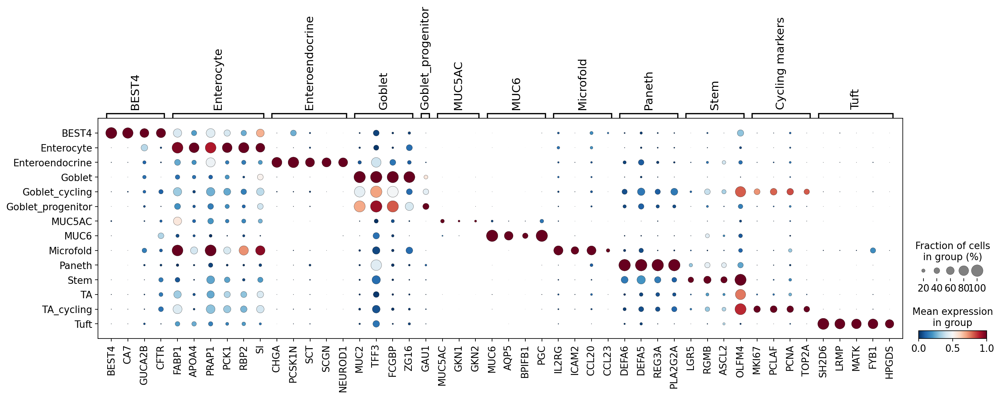

In [15]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_SI_markers.png',color_map='RdBu_r', standard_scale='var')

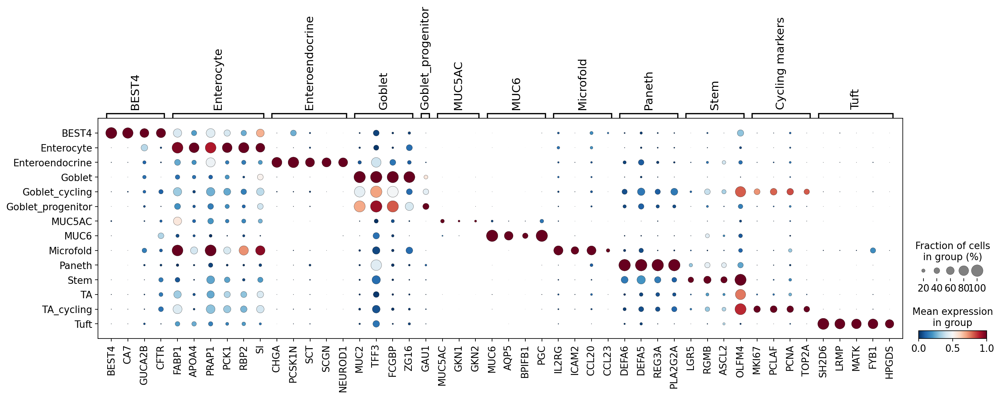

In [16]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_SI_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [17]:
#make plots for paper

In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [3]:
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/compartments/annotated_v3/no_doublets/SI_AP_epi.hvg5000_noRPL.scvi_output.annotv3.nodoublets.22021208.h5ad')

In [4]:
adata.obs['fine_annot'] = adata.obs["annot_v3"].str.replace("SI_AP_","")
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {
 'enterocyte':'Enterocyte',
        'stem':'Stem',
 'enteroendocrine':'Enteroendocrine',
 'microfold':'Microfold',
 'tuft':'Tuft',
 'goblet_progenitor':'Goblet_progenitor',
 'goblet':'Goblet',
 'goblet_cycling':'Goblet_cycling',
 'paneth':'Paneth'
        
         }.get(x, x))
    .astype("category")
)

In [5]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {
 'MUC5AC':'Surface_foveolar',
        'MUC6':'Mucous_gland_neck'
        
         }.get(x, x))
    .astype("category")
)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


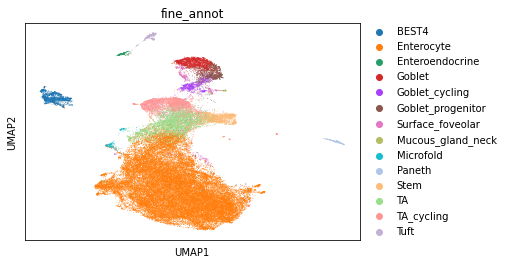

In [6]:
sc.pl.umap(adata,color='fine_annot')

In [7]:
adata.obs['fine_annot'] = (
    adata.obs["fine_annot"]
    .map(lambda x: {
 'TA_cycling':'TA'
        
         }.get(x, x))
    .astype("category")
)

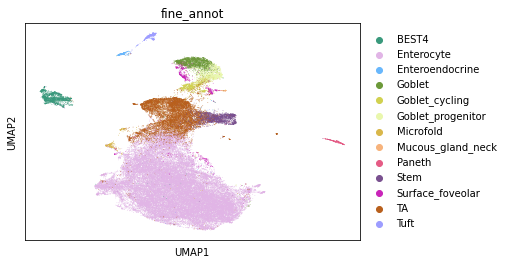

In [8]:
sc.pl.umap(adata,color='fine_annot',palette = ['#39997c',#BEST4
                                               '#e1b5e6',#enterocyte
                                                '#68b7fc',#enteroendocrine
                                               
                                               '#6c9939',#goblet
                                               '#d1d14f',#goblet_cycling
                                               '#e9f7ad',#goblet progenitor
                                               
                                               '#d9b74a',#MUC5AC
                                               '#f7b37c',#MUC6
                                               
                                               '#e55b85',#Microfold
                                               '#79508f',#paneth
                                               '#c924b9',#stem
                                              #'#ad1a55',#TA
                                               '#b85f1c',#TA cycling
                                               '#9d9dff',#tuft
                                               
                                               
    
    
                                              ])

In [9]:
list(adata.obs['fine_annot'].unique())

['Enterocyte',
 'BEST4',
 'Stem',
 'TA',
 'Enteroendocrine',
 'Microfold',
 'Tuft',
 'Mucous_gland_neck',
 'Goblet_progenitor',
 'Surface_foveolar',
 'Goblet',
 'Goblet_cycling',
 'Paneth']

In [10]:
adata.obs['fine_annot'].cat.reorder_categories([ 'BEST4',
                                                'Enterocyte',
                                                'Enteroendocrine',
                                                'Goblet',
 'Goblet_cycling',
                                                 'Goblet_progenitor',
                                                 'Surface_foveolar',
                                                 'Mucous_gland_neck',
                                                 'Microfold',
                                                 'Paneth',
 'Stem',
 'TA',
 

 'Tuft',



 
 ], inplace=True)

<ipython-input-10-ab189b85649c>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['fine_annot'].cat.reorder_categories([ 'BEST4',


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


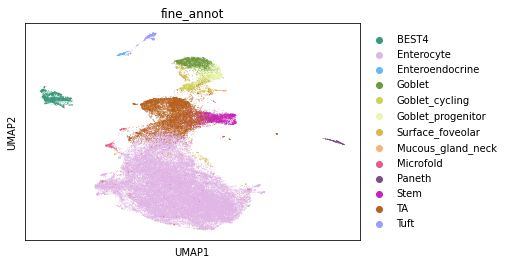

In [11]:
sc.pl.umap(adata,color='fine_annot',save='SI_AP_epi_annot.png')

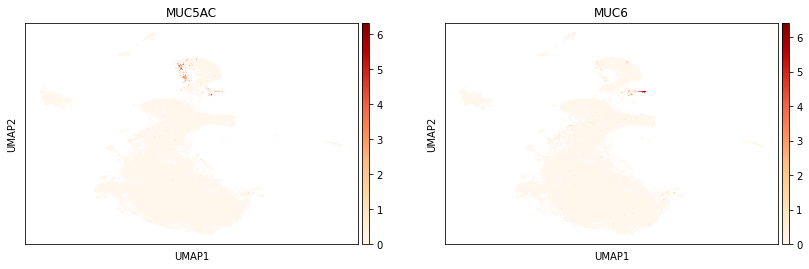

In [12]:
sc.pl.umap(adata,color=['MUC5AC','MUC6'],cmap='OrRd')

<AxesSubplot: title={'center': 'fine_annot'}, xlabel='UMAP1', ylabel='UMAP2'>

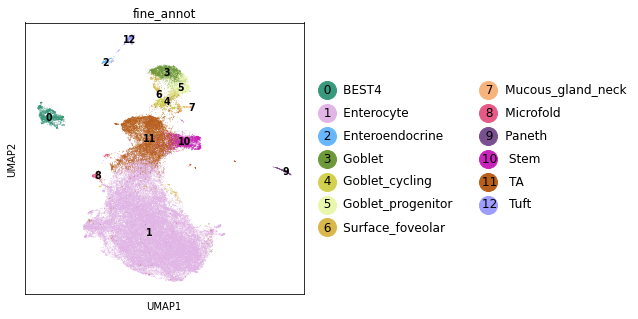

In [13]:
import sctk as sk
sk.plot_embedding(
    adata,
    basis="umap",
    groupby="fine_annot",
    figsize=(5, 5),
    save='figures/SI_AP_epi_annot.png')

In [14]:
marker_genes_dict = { 'BEST4 Enterocyte':['BEST4','CA7','OTOP2','CFTR'],
                        'Enterocyte':['FABP1','APOA4','PRAP1','PCK1','RBP2','SI'],
                     'Enteroendocrine':['CHGA','PCSK1N','SCT','SCGN','NEUROD1'],
                     'Goblet':['MUC2','TFF3','FCGBP','ZG16'],
                      'Goblet_progenitor':['GAU1'],
                     'MUC5AC':['MUC5AC','GKN1','GKN2','SLC26A3'],
                     'MUC6':['MUC6','AQP5','BPIFB1','PGC'],
                     'Microfold':['IL2RG','ICAM2','CCL20','CCL23'],
                     'Paneth':['DEFA6','DEFA5','REG3A','PLA2G2A'],
                     'Stem':['LGR5','RGMB','ASCL2','OLFM4'],
                     'Cycling markers':['MKI67','PCLAF','PCNA','TOP2A'],
                     'Tuft':['SH2D6','LRMP','MATK','FYB1','HPGDS','POU2F3', 'TRPM5']
                     }

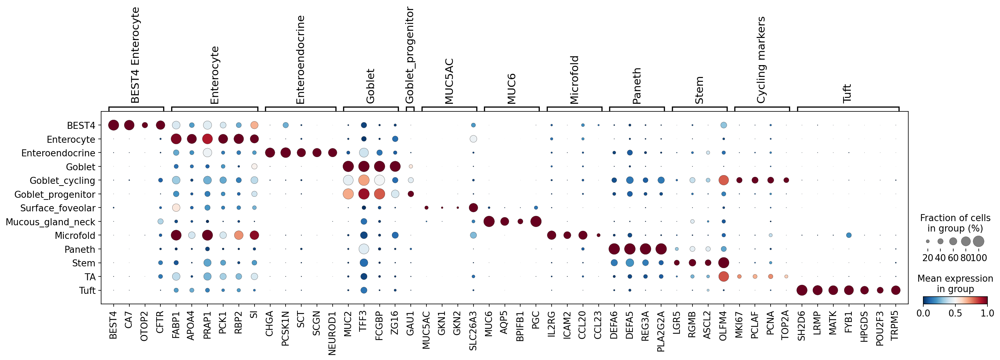

In [15]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_annot',save='Epi_SI_markers.pdf',color_map='RdBu_r', standard_scale='var')

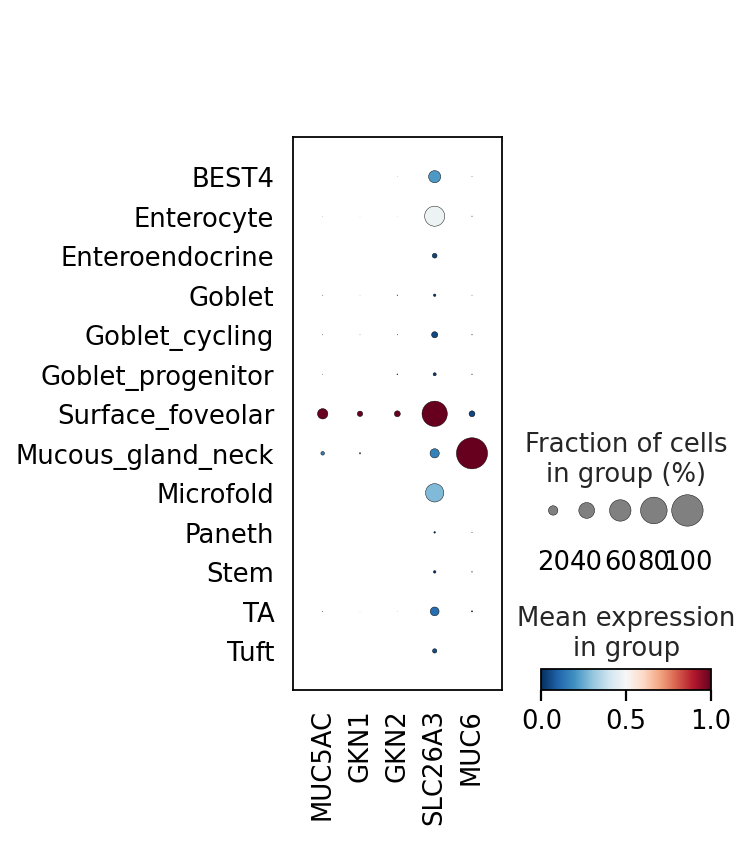

In [23]:
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=['MUC5AC','GKN1','GKN2','SLC26A3','MUC6'],groupby='fine_annot',save='SF_markers.pdf',color_map='RdBu_r', standard_scale='var')

In [18]:
sns.set_style(style="white")
sns.set_context(context="paper")

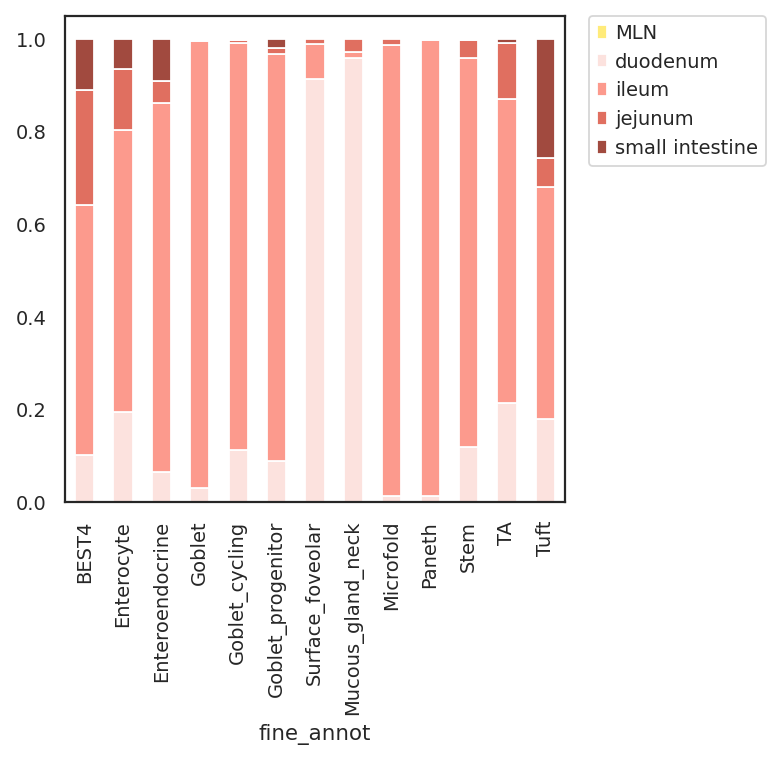

In [21]:
tmp = pd.crosstab(adata.obs['fine_annot'], adata.obs['organ_unified'],normalize='index')
tmp.plot.bar(stacked=True,color={'duodenum': '#fce2de',
  'jejunum': '#e06f60',
  'ileum': '#fc9a8d',
'small intestine': '#a14a3f',
'MLN': '#ffeb7a'}).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
plt.savefig('/nfs/team205/ao15/Megagut/Annotations_v3/compartment_annotations/figures/SI_AP_organ_distribution_level3annot.pdf')